In [1]:
import xarray as xr
import gcsfs
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import time
from matplotlib.colors import LogNorm
from IPython.display import clear_output
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

from intake import open_catalog

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.utils import plot_model

import pandas as pd
from timeit import default_timer as timer


In [2]:
plt.rcParams.update({'font.size': 14
    , 'legend.markerscale': 1., 'axes.titlesize': 14, 'axes.labelsize' : 12,
      'legend.fontsize' : 13,'legend.handlelength': 3})

plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=10)

color2 = '#6495ed'
color1 = '#ff6347'
color5 = '#8470ff'
color3 = '#3cb371'
color4 = '#ffd700'
color6 = '#ba55d3'
# plt.rcParams['figure.figsize'] = (14.,5.)



blue = cm.get_cmap('Blues', 256)
green = cm.get_cmap('Greens', 256)
red = cm.get_cmap('Reds', 256)
grey = cm.get_cmap('Greys', 256)
bone = cm.get_cmap('bone_r', 256)
binary = cm.get_cmap('binary', 256)
hot = cm.get_cmap('hot_r', 256)
gray = cm.get_cmap('gray_r', 256)


newcolors5 = blue(np.linspace(0, 1, 256))**2*grey(np.linspace(0, 1, 256))**0.2
newcmp5 = ListedColormap(newcolors5[::-1], name='BlueGrey')

newcolors7 = blue(np.linspace(0, 1, 256))**1.5*green(np.linspace(0, 1, 256))**0.3*grey(np.linspace(0, 1, 256))**0.03
newcmp7 = ListedColormap(newcolors7[::-1], name='BluegreenGrey')

newcmp6 = ListedColormap(newcolors5, name='BlueGrey_r')
newcmp8 = ListedColormap(newcolors7, name='BlueGreenGrey_r')

def plot_examples(cms):
    """
    helper function to plot two colormaps
    """
    np.random.seed(19680801)
    data = np.random.randn(30, 30)

    fig, axs = plt.subplots(1, 2, figsize=(6, 3), constrained_layout=True)
    for [ax, cmap] in zip(axs, cms):
        psm = ax.pcolormesh(data, cmap=cmap, rasterized=True, vmin=-4, vmax=4)
        fig.colorbar(psm, ax=ax)
    plt.show()

In [3]:
cat = open_catalog("https://raw.githubusercontent.com/pangeo-data/pangeo-datastore/master/intake-catalogs/ocean/CESM_POP.yaml")
ds  = cat["CESM_POP_hires_control"].to_dask()
# ds

In [4]:
ds = ds.rename({'U1_1':'U', 'V1_1':'V', 'TAUX_2':'TAUX', 'TAUY_2':'TAUY', 'SSH_2':'SSH', 'ULONG':'XU', 'ULAT':'YU'})

def make_3d_coords(lon,lat):
    X = np.sin(np.radians(lat))
    Y = np.sin(np.radians(lon))*np.cos(np.radians(lat))
    Z = -np.cos(np.radians(lon))*np.cos(np.radians(lat))
    return (X,Y,Z)

X, Y, Z = make_3d_coords(ds.XU.data, ds.YU.data)

ds['X'] = ds.XU.dims, X
ds['Y'] = ds.XU.dims, Y
ds['Z'] = ds.XU.dims, Z

def normalize_gridspacing(DX,DY):
    dX = (DX - np.mean(DX))/np.std(DX)
    dY = (DY - np.mean(DY))/np.std(DY)
    
    return (dX, dY)

dX, dY = normalize_gridspacing(ds.DXT.data, ds.DYT.data)

ds['dx'] = ds.XU.dims, dX
ds['dy'] = ds.XU.dims, dY

ds

<xarray.Dataset>
Dimensions:             (nlat: 2400, nlon: 3600, time: 14965, z_t: 62, z_t_150m: 15, z_w: 62, z_w_bot: 62, z_w_top: 62)
Coordinates:
    ANGLE               (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    ANGLET              (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    DXT                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    DXU                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    DYT                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    DYU                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    HT                  (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    HTE                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    HTN                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    HU                  (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    HUS                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    HUW                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    KMT                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    KMU                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    REGION_MASK         (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    T0_Kelvin           float64 ...
    TAREA               (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    TLAT                (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    TLONG               (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    UAREA               (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    YU                  (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    XU                  (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    cp_air              float64 ...
    cp_sw               float64 ...
    days_in_norm_year   timedelta64[ns] ...
    dz                  (z_t) float32 dask.array<chunksize=(62,), meta=np.ndarray>
    dzw                 (z_w) float32 dask.array<chunksize=(62,), meta=np.ndarray>
    fwflux_factor       float64 ...
    grav                float64 ...
    heat_to_PW          float64 ...
    hflux_factor        float64 ...
    latent_heat_fusion  float64 ...
    latent_heat_vapor   float64 ...
    mass_to_Sv          float64 ...
    momentum_factor     float64 ...
    nsurface_t          float64 ...
    nsurface_u          float64 ...
    ocn_ref_salinity    float64 ...
    omega               float64 ...
    ppt_to_salt         float64 ...
    radius              float64 ...
    rho_air             float64 ...
    rho_fw              float64 ...
    rho_sw              float64 ...
    salinity_factor     float64 ...
    salt_to_Svppt       float64 ...
    salt_to_mmday       float64 ...
    salt_to_ppt         float64 ...
    sea_ice_salinity    float64 ...
    sflux_factor        float64 ...
    sound               float64 ...
    stefan_boltzmann    float64 ...
  * time                (time) object 0046-01-02 00:00:00 ... 0087-01-01 00:0...
    vonkar              float64 ...
  * z_t                 (z_t) float32 500.0 1.5e+03 ... 5.625e+05 5.875e+05
  * z_t_150m            (z_t_150m) float32 500.0 1.5e+03 ... 1.35e+04 1.45e+04
  * z_w                 (z_w) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
  * z_w_bot             (z_w_bot) float32 1e+03 2e+03 3e+03 ... 5.75e+05 6e+05
  * z_w_top             (z_w_top) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
Dimensions without coordinates: nlat, nlon
Data variables:
    HMXL_2              (time, 

In [5]:
def reshape_stencil(data, ssize):
    assert data.ndim == 2
    ny, nx = data.shape
    data_rs = data.reshape((ny//ssize, ssize,  nx//ssize, ssize))
    # move stencil to end
    data_mv = np.moveaxis(data_rs, 1, 2)
    data_flat = data_mv.reshape((-1, 2, 2))
    return data_flat

def extract_data(ds, vname, stencil_size, indexer):
    data = ds[vname].values
    data_rs = reshape_stencil(data, stencil_size)
    data_idx = data_rs[(slice(None),) + indexer]
    return data_idx

In [6]:

def prepare_data_2D(ds, apply_mask=True, randomize=True,stencil_size = 2,
                 stencil_vars = ['SSH', 'SST', 'X', 'Y', 'Z'], stencil_index = (slice(None), slice(None)),
                 point_vars = ['TAUX', 'TAUY'], point_index = (0, 0), 
                 target_vars = ['U', 'V'], target_index = (0, 0) ):
    
    stencil_data = [extract_data(ds, vname, stencil_size, stencil_index)
                    for vname in stencil_vars]
    point_data = [extract_data(ds, vname, stencil_size, point_index)
                   for vname in point_vars]
    target_data = [extract_data(ds, vname, stencil_size, target_index)
                   for vname in target_vars]

    if apply_mask:
        mask = np.isnan(stencil_data[0]).sum(axis=(1, 2)) == 0
    else:
        mask = slice(None)
    if randomize:
        random_idx = np.random.permutation(mask.sum())
    else:
        random_idx = slice(None)

    features_stencil = np.stack([data[mask][random_idx] for data in stencil_data],
                                axis=-1)
    features_point = np.stack([data[mask][random_idx] for data in point_data],
                               axis=-1)
    targets = np.stack([data[mask][random_idx] for data in target_data],
                        axis=-1)
    
    return [features_stencil, features_point], targets

In [7]:
def reshape_stencil(data, ssize):
    assert data.ndim == 2
    ny, nx = data.shape
    data_rs = data.reshape((ny//ssize, ssize,  nx//ssize, ssize))
    # move stencil to end
    data_mv = np.moveaxis(data_rs, 1, 2)
    data_flat = data_mv.reshape((-1, 2, 2))
    return data_flat

def reshape_stencil_time(data, ssize):
    assert data.ndim == 3
    nt, ny, nx = data.shape
    data_rs = data.reshape((nt, ny//ssize, ssize,  nx//ssize, ssize))
    # move stencil to end
    data_mv = np.moveaxis(np.moveaxis(data_rs, 2, 3), 0,4)
    data_flat = data_mv.reshape((-1, 2, 2, 3))
    return data_flat

def extract_data_loc(ds, vname, stencil_size, indexer):
    data = ds[vname].values
    data_rs = reshape_stencil(data, stencil_size)
    data_idx = data_rs[(slice(None),) + indexer]
    return data_idx

def extract_data_time(ds, vname, stencil_size, indexer):
    data = ds[vname].values
    data_rs = reshape_stencil_time(data, stencil_size)
    data_idx = data_rs[(slice(None),) + indexer]
    return data_idx

def prepare_data_3dpointloc(ds, apply_mask=True, randomize=True, stencil_size = 2,
                            stencil_time_vars = ['SSH',], stencil_time_index = (slice(None), slice(None), slice(None)),
                            point_vars = ['TAUX', 'TAUY'], point_index = (1, 0, 0), 
                            loc_vars = ['X','dx','dy'], loc_index = (0, 0), 
                            target_vars = ['U', 'V'], target_index = (1, 0, 0) ):
    
    stencil_time_data = [extract_data_time(ds, vname, stencil_size, stencil_time_index)
                    for vname in stencil_time_vars]    
    loc_data = [extract_data_loc(ds, vname, stencil_size, loc_index)
                    for vname in loc_vars]
    point_data = [extract_data_time(ds, vname, stencil_size, point_index)
                   for vname in point_vars]
    target_data = [extract_data_time(ds, vname, stencil_size, target_index)
                   for vname in target_vars]

    if apply_mask:
        mask = np.isnan(stencil_time_data[0]).sum(axis=(1, 2, 3)) == 0
    else:
        mask = slice(None)
    if randomize:
        random_idx = np.random.permutation(mask.sum())
    else:
        random_idx = slice(None)

    features_stencil_time = np.stack([data[mask][random_idx] for data in stencil_time_data],
                                axis=-1)
    features_loc = np.stack([data[mask][random_idx] for data in loc_data],
                                axis=-1)
    
    features_point = np.stack([data[mask][random_idx] for data in point_data],
                               axis=-1)
    targets = np.stack([data[mask][random_idx] for data in target_data],
                        axis=-1)
    return [features_stencil_time, features_point, features_loc], targets


def prepare_data_3dloc(ds, apply_mask=True, randomize=True, stencil_size = 2,
                            stencil_time_vars = ['SSH',], stencil_time_index = (slice(None), slice(None), slice(None)),
                            loc_vars = ['X','dx','dy'], loc_index = (0, 0), 
                            target_vars = ['U', 'V'], target_index = (1, 0, 0) ):
    
    stencil_time_data = [extract_data_time(ds, vname, stencil_size, stencil_time_index)
                    for vname in stencil_time_vars]    
    loc_data = [extract_data_loc(ds, vname, stencil_size, loc_index)
                    for vname in loc_vars]
    target_data = [extract_data_time(ds, vname, stencil_size, target_index)
                   for vname in target_vars]

    if apply_mask:
        mask = np.isnan(stencil_time_data[0]).sum(axis=(1, 2, 3)) == 0
    else:
        mask = slice(None)
    if randomize:
        random_idx = np.random.permutation(mask.sum())
    else:
        random_idx = slice(None)

    features_stencil_time = np.stack([data[mask][random_idx] for data in stencil_time_data],
                                axis=-1)
    features_loc = np.stack([data[mask][random_idx] for data in loc_data],
                                axis=-1)
    targets = np.stack([data[mask][random_idx] for data in target_data],
                        axis=-1)
    return [features_stencil_time, features_loc], targets


In [8]:
labels = {}

labels['00'] = 'SSH_2ps_pointTAUXTAUY_3l_402010_nf80'
labels['01'] = 'SSH_2ps_pointX_3l_402010_nf80'
labels['02'] = 'SSHSST_2ps_pointX_3l_402010_nf80'
labels['03'] = 'SSH_2ps_pointXTAUXTAUY_3l_402010_nf80'
labels['04'] = 'SSHSST_2ps_pointXTAUXTAUY_3l_402010_nf80'
labels['05'] = 'SSHXYZ_2ps_pointTAUXTAUY_3l_402010_nf80'
labels['06'] = 'SSHX_2ps_pointTAUXTAUY_3l_402010_nf80'
labels['07'] = 'SSHSSTXYZ_2ps_pointTAUXTAUY_3l_402010_nf80'
labels['08'] = 'SSHSSTX_2ps_pointTAUXTAUY_3l_402010_nf80'
labels['09'] = 'SSHTAUXTAUY_2ps_pointX_3l_402010_nf80'
labels['10'] = 'SSHSSTTAUXTAUY_2ps_pointX_3l_402010_nf80'
labels['11'] = 'SSHSST_2ps_pointXdxdyTAUXTAUY_3l_402010_nf80'
labels['12'] = 'SSHSSTSSS_2ps_pointXdxdyTAUXTAUY_3l_402010_nf80'
labels['000'] = 'SSH_3pt2ps_pointXdxdyTAUXTAUY_3l_402010_nf80'
labels['001'] = 'SSHSST_3pt2ps_pointXdxdyTAUXTAUY_3l_402010_nf80'
labels['002'] = 'SSH_3pt2ps_pointXTAUXTAUY_3l_402010_nf80'
labels['003'] = 'SSHSST_3pt2ps_pointXTAUXTAUY_3l_402010_nf80'
labels['004'] = 'SSH_3pt2ps_pointXdxdy_3l_402010_nf80'
labels['005'] = 'SSHSST_3pt2ps_pointXdxdy_3l_402010_nf80'
labels['006'] = 'SSH_3pt2ps_pointX_3l_402010_nf80'
labels['007'] = 'SSHSST_3pt2ps_pointX_3l_402010_nf80'
labels['008'] = 'SSHSSTSSS_3pt2ps_pointXTAUXTAUY_3l_402010_nf80'
labels['009'] = 'SSHSSTSSS_3pt2ps_pointXdxdyTAUXTAUY_3l_402010_nf80'


In [9]:
m2d_keys = ['00','01','02','03','04','05','06','07','08','09','10','11','12']
m3d_keys = ['000','001','002','003','004','005','006','007','008','009']

In [10]:
model2 = {}
history2 = {}
for r in m3d_keys:
    model2[r] = keras.models.load_model('models/' + labels[r])
    history2[r] = np.load('models/history_%s.npz' %labels[r])

In [11]:
model = {}
history = {}
for r in m2d_keys:
    model[r] = keras.models.load_model('models/' + labels[r])
    history[r] = np.load('models/history_%s.npz' %labels[r])

In [12]:
features_pred = {}
targets_true = {}
features_test = {}
targets_test = {}

In [13]:
features_pred = {}
targets_true = {}

In [14]:
%%time

features_pred['00'], targets_true['00'] = prepare_data_2D(ds.isel(time=365*10+70), stencil_vars = ['SSH',], point_vars=['TAUX','TAUY',],
                                                          apply_mask=False, randomize=False,)
features_pred['01'], targets_true['01'] = prepare_data_2D(ds.isel(time=365*10+70), stencil_vars = ['SSH',], point_vars=['X',],
                                                          apply_mask=False, randomize=False,)
features_pred['02'], targets_true['02'] = prepare_data_2D(ds.isel(time=365*10+70), stencil_vars = ['SSH','SST',], point_vars=['X',],
                                                          apply_mask=False, randomize=False,)
features_pred['03'], targets_true['03'] = prepare_data_2D(ds.isel(time=365*10+70), stencil_vars = ['SSH',], point_vars=['X','TAUX','TAUY',],
                                                          apply_mask=False, randomize=False,)
features_pred['04'], targets_true['04'] = prepare_data_2D(ds.isel(time=365*10+70), stencil_vars = ['SSH','SST',], point_vars=['X','TAUX','TAUY'],
                                                          apply_mask=False, randomize=False,)
features_pred['05'], targets_true['05'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','X','Y','Z'], point_vars=['TAUX','TAUY',],
                                                          apply_mask=False, randomize=False,)
features_pred['06'], targets_true['06'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','X',], point_vars=['TAUX','TAUY',],
                                                          apply_mask=False, randomize=False,)
features_pred['07'], targets_true['07'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','SST','X','Y','Z',], point_vars=['TAUX','TAUY'],
                                                          apply_mask=False, randomize=False,)
features_pred['08'], targets_true['08'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','SST','X'], point_vars=['TAUX','TAUY'],
                                                          apply_mask=False, randomize=False,)
features_pred['09'], targets_true['09'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','TAUX','TAUY',], point_vars=['X',],
                                                          apply_mask=False, randomize=False,)
features_pred['10'], targets_true['10'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','SST','TAUX','TAUY',], point_vars=['X'],
                                                          apply_mask=False, randomize=False,)
features_pred['11'], targets_true['11'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','SST',], point_vars=['X','dx','dy','TAUX','TAUY'],
                                                          apply_mask=False, randomize=False,)
features_pred['12'], targets_true['12'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','SST','SSS'], point_vars=['X','dx','dy','TAUX','TAUY'],
                                                          apply_mask=False, randomize=False,)

features_pred['000'], targets_true['000'] = prepare_data_3dpointloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH',], 
                                                        point_vars=['TAUX','TAUY',], 
                                                        loc_vars = ['X','dx','dy'], apply_mask=False, randomize=False,)
features_pred['001'], targets_true['001'] = prepare_data_3dpointloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH','SST',], 
                                                        point_vars=['TAUX','TAUY',], 
                                                        loc_vars = ['X','dx','dy'], apply_mask=False, randomize=False,)
features_pred['002'], targets_true['002'] = prepare_data_3dpointloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH',], 
                                                        point_vars=['TAUX','TAUY',], 
                                                        loc_vars = ['X'], apply_mask=False, randomize=False,)
features_pred['003'], targets_true['003'] = prepare_data_3dpointloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH', 'SST'], 
                                                        point_vars=['TAUX','TAUY',], 
                                                        loc_vars = ['X'], apply_mask=False, randomize=False,)
features_pred['004'], targets_true['004'] = prepare_data_3dloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH',], 
                                                        loc_vars = ['X','dx','dy'], apply_mask=False, randomize=False,)
features_pred['005'], targets_true['005'] = prepare_data_3dloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH','SST'], 
                                                        loc_vars = ['X','dx','dy'], apply_mask=False, randomize=False,)
features_pred['006'], targets_true['006'] = prepare_data_3dloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH',], 
                                                        loc_vars = ['X',], apply_mask=False, randomize=False,)
features_pred['007'], targets_true['007'] = prepare_data_3dloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH','SST',], 
                                                        loc_vars = ['X',], apply_mask=False, randomize=False,)
features_pred['008'], targets_true['008'] = prepare_data_3dpointloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH', 'SST', 'SSS',], 
                                                        point_vars=['TAUX','TAUY',], 
                                                        loc_vars = ['X'], apply_mask=False, randomize=False,)
features_pred['009'], targets_true['009'] = prepare_data_3dpointloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH', 'SST', 'SSS'], 
                                                        point_vars=['TAUX','TAUY',], 
                                                        loc_vars = ['X', 'dx', 'dy'], apply_mask=False, randomize=False,)


CPU times: user 56.3 s, sys: 28.3 s, total: 1min 24s
Wall time: 1min 34s


In [15]:
%%time


features_test['00'], targets_test['00'] = prepare_data_2D(ds.isel(time=365*10+70), stencil_vars = ['SSH',], point_vars=['TAUX','TAUY',],
                                                          apply_mask=True, randomize=False,)
features_test['01'], targets_test['01'] = prepare_data_2D(ds.isel(time=365*10+70), stencil_vars = ['SSH',], point_vars=['X',],
                                                          apply_mask=True, randomize=False,)
features_test['02'], targets_test['02'] = prepare_data_2D(ds.isel(time=365*10+70), stencil_vars = ['SSH','SST',], point_vars=['X',],
                                                          apply_mask=True, randomize=False,)
features_test['03'], targets_test['03'] = prepare_data_2D(ds.isel(time=365*10+70), stencil_vars = ['SSH',], point_vars=['X','TAUX','TAUY',],
                                                          apply_mask=True, randomize=False,)
features_test['04'], targets_test['04'] = prepare_data_2D(ds.isel(time=365*10+70), stencil_vars = ['SSH','SST',], point_vars=['X','TAUX','TAUY'],
                                                          apply_mask=True, randomize=False,)
features_test['05'], targets_test['05'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','X','Y','Z'], point_vars=['TAUX','TAUY',],
                                                          apply_mask=True, randomize=False,)
features_test['06'], targets_test['06'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','X',], point_vars=['TAUX','TAUY',],
                                                          apply_mask=True, randomize=False,)
features_test['07'], targets_test['07'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','SST','X','Y','Z',], point_vars=['TAUX','TAUY'],
                                                          apply_mask=True, randomize=False,)
features_test['08'], targets_test['08'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','SST','X'], point_vars=['TAUX','TAUY'],
                                                          apply_mask=True, randomize=False,)
features_test['09'], targets_test['09'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','TAUX','TAUY',], point_vars=['X',],
                                                          apply_mask=True, randomize=False,)
features_test['10'], targets_test['10'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','SST','TAUX','TAUY',], point_vars=['X'],
                                                          apply_mask=True, randomize=False,)
features_test['11'], targets_test['11'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','SST',], point_vars=['X','dx','dy','TAUX','TAUY'],
                                                          apply_mask=True, randomize=False,)
features_test['12'], targets_test['12'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','SST','SSS'], point_vars=['X','dx','dy','TAUX','TAUY'],
                                                          apply_mask=True, randomize=False,)

features_test['000'], targets_test['000'] = prepare_data_3dpointloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH',], 
                                                        point_vars=['TAUX','TAUY',], 
                                                        loc_vars = ['X','dx','dy'], apply_mask=True, randomize=False,)
features_test['001'], targets_test['001'] = prepare_data_3dpointloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH','SST',], 
                                                        point_vars=['TAUX','TAUY',], 
                                                        loc_vars = ['X','dx','dy'], apply_mask=True, randomize=False,)
features_test['002'], targets_test['002'] = prepare_data_3dpointloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH',], 
                                                        point_vars=['TAUX','TAUY',], 
                                                        loc_vars = ['X'], apply_mask=True, randomize=False,)
features_test['003'], targets_test['003'] = prepare_data_3dpointloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH', 'SST'], 
                                                        point_vars=['TAUX','TAUY',], 
                                                        loc_vars = ['X'], apply_mask=True, randomize=False,)
features_test['004'], targets_test['004'] = prepare_data_3dloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH',], 
                                                        loc_vars = ['X','dx','dy'], apply_mask=True, randomize=False,)
features_test['005'], targets_test['005'] = prepare_data_3dloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH','SST'], 
                                                        loc_vars = ['X','dx','dy'], apply_mask=True, randomize=False,)
features_test['006'], targets_test['006'] = prepare_data_3dloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH',], 
                                                        loc_vars = ['X',], apply_mask=True, randomize=False,)
features_test['007'], targets_test['007'] = prepare_data_3dloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH','SST',], 
                                                        loc_vars = ['X',], apply_mask=True, randomize=False,)

features_test['008'], targets_test['008'] = prepare_data_3dpointloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH', 'SST', 'SSS',], 
                                                        point_vars=['TAUX','TAUY',], 
                                                        loc_vars = ['X'], apply_mask=True, randomize=False,)
features_test['009'], targets_test['009'] = prepare_data_3dpointloc(ds.isel(time=slice(365*10+70, 365*10+73)),
                                                        stencil_time_vars = ['SSH', 'SST', 'SSS'], 
                                                        point_vars=['TAUX','TAUY',], 
                                                        loc_vars = ['X', 'dx', 'dy'], apply_mask=True, randomize=False,)



CPU times: user 56.7 s, sys: 16.2 s, total: 1min 12s
Wall time: 1min 19s


In [16]:
meval = {}

In [17]:
for mnum in m2d_keys:
    meval[mnum] = model[mnum].evaluate(features_test[mnum], targets_test[mnum])


41967/41967 [==============================] - 60s 1ms/step - loss: 3.4722 - mean_absolute_error: 3.4722 - mean_squared_error: 37.2861 - accuracy: 0.8612


In [18]:
for mnum in m3d_keys:
    meval[mnum] = model2[mnum].evaluate(features_test[mnum], targets_test[mnum])


41967/41967 [==============================] - 62s 1ms/step - loss: 4.4022 - mean_absolute_error: 4.4022 - mean_squared_error: 54.0769 - accuracy: 0.8570


In [15]:
targets_pred = {}

In [16]:
for mnum in model.keys():
    start = timer()
    targets_pred[mnum] = model[mnum].predict(features_pred[mnum])
    end = timer()
    print(mnum, end - start)

00 53.92612027199357
01 52.27095877498505
02 52.85549004698987
03 50.44180614699144
04 52.706384760997025
05 52.63889901500079
06 50.98574348699185
07 51.76041247500689
08 53.73797122499673
09 51.851788981002755
10 54.947745779994875
11 50.66304309401312
12 50.60003139602486


In [17]:
for mnum in model2.keys():
    start = timer()
    targets_pred[mnum] = model2[mnum].predict(features_pred[mnum])
    end = timer()
    print(mnum, end - start)

000 53.318155894987285
001 53.76331851401483
002 60.87515389602049
003 55.36607469097362
004 59.13592755998252
005 59.21424928799388
006 53.27824351901654
007 58.09176001299056
008 56.039849399996456
009 53.65451833399129


In [22]:
# mae2 = np.array([7.7946, 5.1257, 5.1260, 3.1067, 3.2977, 3.0840, 3.2387, 3.3040, 3.7069, 3.6339, 3.2265, 4.0232])
# mse2 = np.array([233.0203, 63.3984, 65.9020, 39.5688, 36.4640, 34.4702, 39.0651, 37.6900, 41.3248, 40.4397, 36.7599, 46.0133 ])
# acc2 = np.array([0.6970, 0.7765, 0.7963, 0.9063, 0.8699, 0.8924, 0.9052, 0.8779, 0.8557, 0.8388, 0.8937, 0.9123 ])

# mae3 = np.array([4.6787, 4.4783, 3.9713, 4.2278, 5.3598, 5.6873, 5.6739, 5.5928, 4.3509, 4.4022,])
# mse3 = np.array([56.4924, 51.5324, 44.7217, 53.1741, 66.6272, 77.8924, 72.7270, 72.9671, 52.9664, 54.0769])
# acc3 = np.array([0.8721, 0.8174, 0.8646, 0.8621, 0.7836, 0.7935, 0.7870, 0.8016, 0.8336, 0.8570])


loss_ev = {}
mse_ev = {}
acc_ev = {}
for r in meval.keys():
    loss_ev[r] = meval[r][0]
    mse_ev[r] = meval[r][2]
    acc_ev[r] = meval[r][-1]
# for i,r in enumerate(m2d_keys):
#     loss_ev[r] = mae2[i]
#     mse_ev[r] = mse2[i]
#     acc_ev[r] = acc2[i]
    
# for j,r in enumerate(m3d_keys):
#     loss_ev[r] = mae3[j]
#     mse_ev[r] = mse3[j]
#     acc_ev[r] = acc3[j]

In [18]:
colors = {'00': 'rosybrown', 
          '01' : 'royalblue', 
          '02' : 'mediumblue', 
          '03' : 'midnightblue', 
          '04' : 'slateblue', 
          '05' : 'mediumorchid', 
          '06': 'violet', 
          '07' : 'mediumvioletred', 
          '08' : 'crimson', 
          '09' : 'firebrick', 
          '10' : 'coral', 
          '11' : 'chocolate',
          '12' : 'saddlebrown',
          '000': 'forestgreen', 
          '001' : 'darkgreen', 
          '002' : 'teal', 
          '003' : 'aqua', 
          '004' : 'springgreen', 
          '005' : 'mediumaquamarine', 
          '006': 'darkturquoise', 
          '007' : 'deepskyblue', 
          '008' : 'steelblue', 
          '009' : 'dodgerblue', 
         }


In [19]:
history_all = {}
for m2 in m2d_keys:
    history_all[m2] = history[m2]
for m3 in m3d_keys:
    history_all[m3] = history2[m3]


In [20]:
plabels = {'00' : r'$\eta$ (2s), $\tau_x, \tau_y$ (point)', 
           '01' : r'$\eta$ (2s), $X$ (point)', 
           '02' : r'$\eta, \theta$ (2s), $X$ (point)', 
           '03' : r'$\eta$ (2s), $X, \tau_x, \tau_y$ (point)', 
           '04' : r'$\eta, \theta$ (2s), $X, \tau_x, \tau_y$ (point)', 
           '05' : r'$\eta, X, Y, Z$ (2s), $\tau_x, \tau_y$ (point)', 
           '06' : r'$\eta, X$ (2s), $\tau_x, \tau_y$ (point)', 
           '07' : r'$\eta, \theta, X, Y, Z$ (2s), $\tau_x, \tau_y$ (point)', 
           '08' : r'$\eta, \theta, X$ (2s), $\tau_x, \tau_y$ (point)', 
           '09' : r'$\eta, \tau_x, \tau_y$ (2s), $X$ (point)', 
           '10' : r'$\eta, \theta, \tau_x, \tau_y$ (2s), $X$ (point)', 
           '11' : r'$\eta, \theta$ (2s), $X, dx, dy, \tau_x, \tau_y$ (point)',  
           '12' : r'$\eta, \theta$, S (2s), $X, dx, dy, \tau_x, \tau_y$ (point)',  
           '000' : r'$\eta$ (3t-2s), $X, dx, dy, \tau_x, \tau_y$ (point)', 
           '001' : r'$\eta, \theta$ (3t-2s), $X, dx, dy, \tau_x, \tau_y$ (point)', 
           '002' : r'$\eta$ (3t-2s), $X, \tau_x, \tau_y$ (point)', 
           '003' : r'$\eta, \theta$ (3t-2s), $X, \tau_x, \tau_y$ (point)', 
           '004' : r'$\eta$ (3t-2s), $X, dx, dy$ (point)', 
           '005' : r'$\eta, \theta$ (3t-2s), $X, dx, dy$ (point)', 
           '006' : r'$\eta$ (3t-2s), $X$ (point)', 
           '007' : r'$\eta, \theta$ (3t-2s), $X$ (point)', 
           '008' : r'$\eta, \theta, S$ (3t-2s), $X, \tau_x, \tau_y$ (point)', 
           '009' : r'$\eta, \theta, S$ (3t-2s), $X, dx, dy, \tau_x, \tau_y$ (point)',
          }

In [76]:
# fig = plt.figure(figsize=(14,12), tight_layout=True, dpi=150, )
# for r in ['00','01','03','05','06', '000', '002', '004', '006']:
#     plt.subplot(331)
#     plt.plot(history_all[r]['losses'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(loss_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel(r'batch');
#     plt.ylabel('Mean Absolute Error');
#     plt.xlim([0,1690])
#     plt.ylim([2,12])
# #     plt.grid()
    
#     plt.subplot(332)
#     plt.plot(history_all[r]['mse'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(mse_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel(r'Mean Squared Error [$cm^2/s^2$]');
#     plt.xlim([0,1690])
#     plt.ylim([10,330])
# #     plt.grid(axis='both')
# #     plt.legend()

#     plt.subplot(333)
#     plt.plot(history_all[r]['accuracy'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(acc_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel('Model Accuracy');
#     plt.xlim([0,1690])
#     plt.ylim([0.4,0.98])
# #     plt.grid()
# plt.legend(fontsize=8)

# for r in ['02','04','07','08','11', '001', '003', '005']:
#     plt.subplot(334)
#     plt.plot(history_all[r]['losses'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(loss_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel(r'batch');
#     plt.ylabel('Mean Absolute Error');
#     plt.xlim([0,1690])
#     plt.ylim([2,12])
# #     plt.grid()
# #     plt.legend()
    
#     plt.subplot(335)
#     plt.plot(history_all[r]['mse'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(mse_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel(r'Mean Squared Error [$cm^2/s^2$]');
#     plt.xlim([0,1690])
#     plt.ylim([10,330])
# #     plt.grid(axis='both')
# #     plt.legend()

#     plt.subplot(336)
#     plt.plot(history_all[r]['accuracy'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(acc_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel('Model Accuracy');
#     plt.xlim([0,1690])
#     plt.ylim([0.4,0.98])
# #     plt.grid()
# plt.legend(fontsize=8)
    
# for r in ['09','10', '008', '009']:
#     plt.subplot(337)
#     plt.plot(history_all[r]['losses'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(loss_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel(r'batch');
#     plt.ylabel('Mean Absolute Error');
#     plt.xlim([0,1690])
#     plt.ylim([2,12])
# #     plt.grid()
# #     plt.legend()
    
#     plt.subplot(338)
#     plt.plot(history_all[r]['mse'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(mse_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel(r'Mean Squared Error [$cm^2/s^2$]');
#     plt.xlim([0,1690])
#     plt.ylim([10,330])
# #     plt.grid(axis='both')
# #     plt.legend()

#     plt.subplot(339)
#     plt.plot(history_all[r]['accuracy'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(acc_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel('Model Accuracy');
#     plt.xlim([0,1690])
#     plt.ylim([0.4,0.98])
# #     plt.grid()
# plt.legend(fontsize=8)

# fig.savefig('model_histories_all')

In [28]:
import copy

In [77]:
features_pred['11_deta1'] = copy.deepcopy(features_pred['11'])
features_pred['11_deta10'] = copy.deepcopy(features_pred['11'])
features_pred['11_deta100'] = copy.deepcopy(features_pred['11'])
features_pred['11_dT1'] = copy.deepcopy(features_pred['11'])
features_pred['11_dT10'] = copy.deepcopy(features_pred['11'])
features_pred['11_dX1'] = copy.deepcopy(features_pred['11'])
features_pred['11_ddx1'] = copy.deepcopy(features_pred['11'])
features_pred['11_ddy1'] = copy.deepcopy(features_pred['11'])
features_pred['11_dTAUX1'] = copy.deepcopy(features_pred['11'])
features_pred['11_dTAUY1'] = copy.deepcopy(features_pred['11'])

features_pred['11_deta1'][0][:,:,:,0] = features_pred['11'][0][:,:,:,0] + 1
features_pred['11_deta10'][0][:,:,:,0] = features_pred['11'][0][:,:,:,0] + 10
features_pred['11_deta100'][0][:,:,:,0] = features_pred['11'][0][:,:,:,0] + 100
features_pred['11_dT1'][0][:,:,:,1] = features_pred['11'][0][:,:,:,1] + 1
features_pred['11_dT10'][0][:,:,:,1] = features_pred['11'][0][:,:,:,1] + 10
features_pred['11_dX1'][1][:,0] = features_pred['11'][1][:,0] + 1
features_pred['11_ddx1'][1][:,1] = features_pred['11'][1][:,1] + 1
features_pred['11_ddy1'][1][:,2] = features_pred['11'][1][:,2] + 1
features_pred['11_dTAUX1'][1][:,3] = features_pred['11'][1][:,3] + 1
features_pred['11_dTAUY1'][1][:,4] = features_pred['11'][1][:,4] + 1


features_test['11_deta1'] = copy.deepcopy(features_test['11'])
features_test['11_deta10'] = copy.deepcopy(features_test['11'])
features_test['11_deta100'] = copy.deepcopy(features_test['11'])
features_test['11_dT1'] = copy.deepcopy(features_test['11'])
features_test['11_dT10'] = copy.deepcopy(features_test['11'])
features_test['11_dX1'] = copy.deepcopy(features_test['11'])
features_test['11_dTAUX1'] = copy.deepcopy(features_test['11'])
features_test['11_dTAUY1'] = copy.deepcopy(features_test['11'])
features_test['11_ddx1'] = copy.deepcopy(features_test['11'])
features_test['11_ddy1'] = copy.deepcopy(features_test['11'])

features_test['11_deta1'][0][:,:,:,0] = features_test['11'][0][:,:,:,0] + 1
features_test['11_deta10'][0][:,:,:,0] = features_test['11'][0][:,:,:,0] + 10
features_test['11_deta100'][0][:,:,:,0] = features_test['11'][0][:,:,:,0] + 100
features_test['11_dT1'][0][:,:,:,1] = features_test['11'][0][:,:,:,1] + 1
features_test['11_dT10'][0][:,:,:,1] = features_test['11'][0][:,:,:,1] + 10
features_test['11_dX1'][1][:,0] = features_test['11'][1][:,0] + 1
features_test['11_ddx1'][1][:,1] = features_test['11'][1][:,1] + 1
features_test['11_ddy1'][1][:,2] = features_test['11'][1][:,2] + 1
features_test['11_dTAUX1'][1][:,3] = features_test['11'][1][:,3] + 1
features_test['11_dTAUY1'][1][:,4] = features_test['11'][1][:,4] + 1



In [15]:
features_test['11'], targets_test['11'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','SST',], point_vars=['X','dx','dy','TAUX','TAUY'],
                                                          apply_mask=True, randomize=False,)
features_pred['11'], targets_true['11'] = prepare_data_2D(ds.isel(time=365*10+70), 
                                                          stencil_vars = ['SSH','SST',], point_vars=['X','dx','dy','TAUX','TAUY'],
                                                          apply_mask=False, randomize=False,)


In [79]:
m2d_delta_keys = ['11_deta1', '11_deta10', '11_deta100', '11_dT1', '11_dT10', '11_dX1', '11_ddx1', '11_ddy1', '11_dTAUX1', '11_dTAUY1']

In [ ]:
mev_delta = {}

In [80]:
mev_delta['11'] = model['11'].evaluate(features_test['11'], targets_test['11'])


41967/41967 [==============================] - 53s 1ms/step - loss: 4.0232 - mean_absolute_error: 4.0232 - mean_squared_error: 46.0133 - accuracy: 0.9123


In [81]:
for mnum in m2d_delta_keys:
    mev_delta[mnum] = model['11'].evaluate(features_test[mnum], targets_test['11'])


41967/41967 [==============================] - 51s 1ms/step - loss: 5.2541 - mean_absolute_error: 5.2541 - mean_squared_error: 73.8036 - accuracy: 0.8209


In [17]:
features_test['11_deta1s'] = copy.deepcopy(features_test['11'])
features_test['11_deta2s'] = copy.deepcopy(features_test['11'])
features_test['11_deta05s'] = copy.deepcopy(features_test['11'])
features_test['11_dT1s'] = copy.deepcopy(features_test['11'])
features_test['11_dT2s'] = copy.deepcopy(features_test['11'])
features_test['11_dT05s'] = copy.deepcopy(features_test['11'])
features_test['11_dX1s'] = copy.deepcopy(features_test['11'])
features_test['11_dX2s'] = copy.deepcopy(features_test['11'])
features_test['11_dX05s'] = copy.deepcopy(features_test['11'])
features_test['11_dTAUX1s'] = copy.deepcopy(features_test['11'])
features_test['11_dTAUX2s'] = copy.deepcopy(features_test['11'])
features_test['11_dTAUX05s'] = copy.deepcopy(features_test['11'])
features_test['11_dTAUY1s'] = copy.deepcopy(features_test['11'])
features_test['11_dTAUY2s'] = copy.deepcopy(features_test['11'])
features_test['11_dTAUY05s'] = copy.deepcopy(features_test['11'])
features_test['11_ddx1s'] = copy.deepcopy(features_test['11'])
features_test['11_ddx2s'] = copy.deepcopy(features_test['11'])
features_test['11_ddx05s'] = copy.deepcopy(features_test['11'])
features_test['11_ddy1s'] = copy.deepcopy(features_test['11'])
features_test['11_ddy2s'] = copy.deepcopy(features_test['11'])
features_test['11_ddy05s'] = copy.deepcopy(features_test['11'])

features_test['11_deta1s'][0][:,:,:,0] = features_test['11'][0][:,:,:,0] + 1*np.std(features_test['11'][0][:,:,:,0])
features_test['11_deta2s'][0][:,:,:,0] = features_test['11'][0][:,:,:,0] + 2*np.std(features_test['11'][0][:,:,:,0])
features_test['11_deta05s'][0][:,:,:,0] = features_test['11'][0][:,:,:,0] + 0.5*np.std(features_test['11'][0][:,:,:,0])
features_test['11_dT1s'][0][:,:,:,1] = features_test['11'][0][:,:,:,1]  + 1*np.std(features_test['11'][0][:,:,:,1])
features_test['11_dT2s'][0][:,:,:,1] = features_test['11'][0][:,:,:,1]  + 2*np.std(features_test['11'][0][:,:,:,1])
features_test['11_dT05s'][0][:,:,:,1] = features_test['11'][0][:,:,:,1]  + 0.5*np.std(features_test['11'][0][:,:,:,1])


features_test['11_dX1s'][1][:,0] = features_test['11'][1][:,0] + 1*np.std(features_test['11'][1][:,0])
features_test['11_dX2s'][1][:,0] = features_test['11'][1][:,0] + 2*np.std(features_test['11'][1][:,0])
features_test['11_dX05s'][1][:,0] = features_test['11'][1][:,0] + 0.5*np.std(features_test['11'][1][:,0])

features_test['11_ddx1s'][1][:,1] = features_test['11'][1][:,0] + 1*np.std(features_test['11'][1][:,1])
features_test['11_ddx2s'][1][:,1] = features_test['11'][1][:,0] + 2*np.std(features_test['11'][1][:,1])
features_test['11_ddx05s'][1][:,1] = features_test['11'][1][:,0] + 0.5*np.std(features_test['11'][1][:,1])

features_test['11_ddy1s'][1][:,2] = features_test['11'][1][:,0] + 1*np.std(features_test['11'][1][:,2])
features_test['11_ddy2s'][1][:,2] = features_test['11'][1][:,0] + 2*np.std(features_test['11'][1][:,2])
features_test['11_ddy05s'][1][:,2] = features_test['11'][1][:,0] + 0.5*np.std(features_test['11'][1][:,2])

features_test['11_dTAUX1s'][1][:,3] = features_test['11'][1][:,0] + 1*np.std(features_test['11'][1][:,3])
features_test['11_dTAUX2s'][1][:,3] = features_test['11'][1][:,0] + 2*np.std(features_test['11'][1][:,3])
features_test['11_dTAUX05s'][1][:,3] = features_test['11'][1][:,0] + 0.5*np.std(features_test['11'][1][:,3])

features_test['11_dTAUY1s'][1][:,4] = features_test['11'][1][:,0] + 1*np.std(features_test['11'][1][:,4])
features_test['11_dTAUY2s'][1][:,4] = features_test['11'][1][:,0] + 2*np.std(features_test['11'][1][:,4])
features_test['11_dTAUY05s'][1][:,4] = features_test['11'][1][:,0] + 0.5*np.std(features_test['11'][1][:,4])



In [ ]:
features_pred['11_deta1s'] = copy.deepcopy(features_pred['11'])
features_pred['11_deta2s'] = copy.deepcopy(features_pred['11'])
features_pred['11_deta05s'] = copy.deepcopy(features_pred['11'])
features_pred['11_dT1s'] = copy.deepcopy(features_pred['11'])
features_pred['11_dT2s'] = copy.deepcopy(features_pred['11'])
features_pred['11_dT05s'] = copy.deepcopy(features_pred['11'])
features_pred['11_dX1s'] = copy.deepcopy(features_pred['11'])
features_pred['11_dX2s'] = copy.deepcopy(features_pred['11'])
features_pred['11_dX05s'] = copy.deepcopy(features_pred['11'])
features_pred['11_dTAUX1s'] = copy.deepcopy(features_pred['11'])
features_pred['11_dTAUX2s'] = copy.deepcopy(features_pred['11'])
features_pred['11_dTAUX05s'] = copy.deepcopy(features_pred['11'])
features_pred['11_dTAUY1s'] = copy.deepcopy(features_pred['11'])
features_pred['11_dTAUY2s'] = copy.deepcopy(features_pred['11'])
features_pred['11_dTAUY05s'] = copy.deepcopy(features_pred['11'])
features_pred['11_ddx1s'] = copy.deepcopy(features_pred['11'])
features_pred['11_ddx2s'] = copy.deepcopy(features_pred['11'])
features_pred['11_ddx05s'] = copy.deepcopy(features_pred['11'])
features_pred['11_ddy1s'] = copy.deepcopy(features_pred['11'])
features_pred['11_ddy2s'] = copy.deepcopy(features_pred['11'])
features_pred['11_ddy05s'] = copy.deepcopy(features_pred['11'])

features_pred['11_deta1s'][0][:,:,:,0] = features_pred['11'][0][:,:,:,0] + 1*np.std(features_pred['11'][0][:,:,:,0])
features_pred['11_deta2s'][0][:,:,:,0] = features_pred['11'][0][:,:,:,0] + 2*np.std(features_pred['11'][0][:,:,:,0])
features_pred['11_deta05s'][0][:,:,:,0] = features_pred['11'][0][:,:,:,0] + 0.5*np.std(features_pred['11'][0][:,:,:,0])
features_pred['11_dT1s'][0][:,:,:,1] = features_pred['11'][0][:,:,:,1]  + 1*np.std(features_pred['11'][0][:,:,:,1])
features_pred['11_dT2s'][0][:,:,:,1] = features_pred['11'][0][:,:,:,1]  + 2*np.std(features_pred['11'][0][:,:,:,1])
features_pred['11_dT05s'][0][:,:,:,1] = features_pred['11'][0][:,:,:,1]  + 0.5*np.std(features_pred['11'][0][:,:,:,1])


features_pred['11_dX1s'][1][:,0] = features_pred['11'][1][:,0] + 1*np.std(features_pred['11'][1][:,0])
features_pred['11_dX2s'][1][:,0] = features_pred['11'][1][:,0] + 2*np.std(features_pred['11'][1][:,0])
features_pred['11_dX05s'][1][:,0] = features_pred['11'][1][:,0] + 0.5*np.std(features_pred['11'][1][:,0])

features_pred['11_ddx1s'][1][:,1] = features_pred['11'][1][:,0] + 1*np.std(features_pred['11'][1][:,1])
features_pred['11_ddx2s'][1][:,1] = features_pred['11'][1][:,0] + 2*np.std(features_pred['11'][1][:,1])
features_pred['11_ddx05s'][1][:,1] = features_pred['11'][1][:,0] + 0.5*np.std(features_pred['11'][1][:,1])

features_pred['11_ddy1s'][1][:,2] = features_pred['11'][1][:,0] + 1*np.std(features_pred['11'][1][:,2])
features_pred['11_ddy2s'][1][:,2] = features_pred['11'][1][:,0] + 2*np.std(features_pred['11'][1][:,2])
features_pred['11_ddy05s'][1][:,2] = features_pred['11'][1][:,0] + 0.5*np.std(features_pred['11'][1][:,2])

features_pred['11_dTAUX1s'][1][:,3] = features_pred['11'][1][:,0] + 1*np.std(features_pred['11'][1][:,3])
features_pred['11_dTAUX2s'][1][:,3] = features_pred['11'][1][:,0] + 2*np.std(features_pred['11'][1][:,3])
features_pred['11_dTAUX05s'][1][:,3] = features_pred['11'][1][:,0] + 0.5*np.std(features_pred['11'][1][:,3])

features_pred['11_dTAUY1s'][1][:,4] = features_pred['11'][1][:,0] + 1*np.std(features_pred['11'][1][:,4])
features_pred['11_dTAUY2s'][1][:,4] = features_pred['11'][1][:,0] + 2*np.std(features_pred['11'][1][:,4])
features_pred['11_dTAUY05s'][1][:,4] = features_pred['11'][1][:,0] + 0.5*np.std(features_pred['11'][1][:,4])



In [ ]:
m2d_dsigma_keys = ['11_deta1s', '11_deta2s', '11_deta05s', 
                   '11_dT1s', '11_dT2s', '11_dT05s', 
                   '11_dX1s', '11_dX2s', '11_dX05s', 
                   '11_ddx1s', '11_ddx2s', '11_ddx05s', 
                   '11_ddy1s', '11_ddy2s', '11_ddy05s', 
                   '11_dTAUX1s', '11_dTAUX2s', '11_dTAUX05s', 
                   '11_dTAUY1s', '11_dTAUY2s', '11_dTAUY05s', ]

In [ ]:
m2d_dsigma_keys

In [ ]:
for mnum in m2d_dsigma_keys:
    start = timer()
    targets_pred[mnum] = model['11'].predict(features_pred[mnum])
    end = timer()
    print(mnum, end - start)

In [21]:
def unstack(data_flat, original_shape, stencil_size, target_index=(0, 0)):
    sub_shape = tuple(np.asarray(original_shape) // stencil_size)
    return data_flat.reshape(sub_shape)

In [22]:
%%time

rms_err_zonmean = {}
rms_vel_zonmean = {}
rel_rmse_zonmean = {}
U_true = {}
V_true = {}
U_pred = {}
V_pred = {}
U_err = {}
V_err = {}
u_true_flat = {}
v_true_flat = {}
u_pred_flat = {}
v_pred_flat = {}
rmserror = {}
relrmserror = {}

for mnum in m2d_keys:
    rms_err_zonmean[mnum] = np.nanmean(np.sqrt(unstack(np.sum((targets_true[mnum] - targets_pred[mnum])**2, axis=1), 
                                                       ds.U.shape[1:], 2)),axis=1)
    rms_vel_zonmean[mnum] = np.nanmean(np.sqrt(unstack(np.sum((targets_true[mnum])**2, axis=1), 
                                                       ds.U.shape[1:], 2)),axis=1)
    rel_rmse_zonmean[mnum] = np.nanmean(np.sqrt(unstack(np.sum((targets_true[mnum] - targets_pred[mnum])**2, axis=1), ds.U.shape[1:], 2) / 
                                                unstack(np.sum((targets_true[mnum])**2, axis=1),ds.U.shape[1:], 2)
                                               ),
                                        axis=1)

    U_true[mnum] = unstack(targets_true[mnum][:, 0], ds.U.shape[1:], 2)
    V_true[mnum] = unstack(targets_true[mnum][:, 1], ds.U.shape[1:], 2)
    U_pred[mnum] = unstack(targets_pred[mnum][:, 0], ds.U.shape[1:], 2)
    V_pred[mnum] = unstack(targets_pred[mnum][:, 1], ds.U.shape[1:], 2)
    U_err[mnum] = U_true[mnum] - U_pred[mnum]
    V_err[mnum] = V_true[mnum] - V_pred[mnum]
    u_true_flat[mnum], u_pred_flat[mnum], v_true_flat[mnum], v_pred_flat[mnum] = [np.ma.masked_invalid(data).ravel() 
                                                                                  for data in (U_true[mnum], U_pred[mnum], V_true[mnum], V_pred[mnum])]
    

    rmserror[mnum] = np.sqrt(np.nanmean((U_true[mnum] - U_pred[mnum])**2 + (V_true[mnum] - V_pred[mnum])**2))
    relrmserror[mnum] = np.sqrt(np.nanmean(((U_true[mnum] - U_pred[mnum])**2 + (V_true[mnum] - V_pred[mnum])**2) / (U_true[mnum]**2 + V_true[mnum]**2)))
    

<timed exec>:18: RuntimeWarning: Mean of empty slice
<timed exec>:20: RuntimeWarning: Mean of empty slice
<timed exec>:22: RuntimeWarning: Mean of empty slice


CPU times: user 4.27 s, sys: 469 ms, total: 4.74 s
Wall time: 4.74 s


In [23]:
for mnum in m3d_keys:
    rms_err_zonmean[mnum] = np.nanmean(np.sqrt(unstack(np.sum((targets_true[mnum] - targets_pred[mnum])**2, axis=1), 
                                                       ds.U.shape[1:], 2)),axis=1)
    rms_vel_zonmean[mnum] = np.nanmean(np.sqrt(unstack(np.sum((targets_true[mnum])**2, axis=1), 
                                                       ds.U.shape[1:], 2)),axis=1)
    rel_rmse_zonmean[mnum] = np.nanmean(np.sqrt(unstack(np.sum((targets_true[mnum] - targets_pred[mnum])**2, axis=1), ds.U.shape[1:], 2) / 
                                                unstack(np.sum((targets_true[mnum])**2, axis=1),ds.U.shape[1:], 2)
                                               ),
                                        axis=1)

    U_true[mnum] = unstack(targets_true[mnum][:, 0], ds.U.shape[1:], 2)
    V_true[mnum] = unstack(targets_true[mnum][:, 1], ds.U.shape[1:], 2)
    U_pred[mnum] = unstack(targets_pred[mnum][:, 0], ds.U.shape[1:], 2)
    V_pred[mnum] = unstack(targets_pred[mnum][:, 1], ds.U.shape[1:], 2)
    U_err[mnum] = U_true[mnum] - U_pred[mnum]
    V_err[mnum] = V_true[mnum] - V_pred[mnum]
    u_true_flat[mnum], u_pred_flat[mnum], v_true_flat[mnum], v_pred_flat[mnum] = [np.ma.masked_invalid(data).ravel() 
                                                                                  for data in (U_true[mnum], U_pred[mnum], V_true[mnum], V_pred[mnum])]
    rmserror[mnum] = np.sqrt(np.nanmean((U_true[mnum] - U_pred[mnum])**2 + (V_true[mnum] - V_pred[mnum])**2))
    relrmserror[mnum] = np.sqrt(np.nanmean(((U_true[mnum] - U_pred[mnum])**2 + (V_true[mnum] - V_pred[mnum])**2) / (U_true[mnum]**2 + V_true[mnum]**2)))
    

<ipython-input-23-b419ac9396b3>:2: RuntimeWarning: Mean of empty slice
  rms_err_zonmean[mnum] = np.nanmean(np.sqrt(unstack(np.sum((targets_true[mnum] - targets_pred[mnum])**2, axis=1),
<ipython-input-23-b419ac9396b3>:4: RuntimeWarning: Mean of empty slice
  rms_vel_zonmean[mnum] = np.nanmean(np.sqrt(unstack(np.sum((targets_true[mnum])**2, axis=1),
<ipython-input-23-b419ac9396b3>:6: RuntimeWarning: divide by zero encountered in true_divide
  rel_rmse_zonmean[mnum] = np.nanmean(np.sqrt(unstack(np.sum((targets_true[mnum] - targets_pred[mnum])**2, axis=1), ds.U.shape[1:], 2) /
<ipython-input-23-b419ac9396b3>:6: RuntimeWarning: Mean of empty slice
  rel_rmse_zonmean[mnum] = np.nanmean(np.sqrt(unstack(np.sum((targets_true[mnum] - targets_pred[mnum])**2, axis=1), ds.U.shape[1:], 2) /
<ipython-input-23-b419ac9396b3>:20: RuntimeWarning: divide by zero encountered in true_divide
  relrmserror[mnum] = np.sqrt(np.nanmean(((U_true[mnum] - U_pred[mnum])**2 + (V_true[mnum] - V_pred[mnum])**2) / (U_t

In [50]:
for mnum in m2d_dsigma_keys:
    rms_err_zonmean[mnum] = np.nanmean(np.sqrt(unstack(np.sum((targets_true['11'] - targets_pred[mnum])**2, axis=1), 
                                                       ds.U.shape[1:], 2)),axis=1)
    rms_vel_zonmean[mnum] = np.nanmean(np.sqrt(unstack(np.sum((targets_true['11'])**2, axis=1), 
                                                       ds.U.shape[1:], 2)),axis=1)
    rel_rmse_zonmean[mnum] = np.nanmean(np.sqrt(unstack(np.sum((targets_true['11'] - targets_pred[mnum])**2, axis=1), ds.U.shape[1:], 2) / 
                                                unstack(np.sum((targets_true['11'])**2, axis=1),ds.U.shape[1:], 2)
                                               ),
                                        axis=1)

    U_true[mnum] = unstack(targets_true['11'][:, 0], ds.U.shape[1:], 2)
    V_true[mnum] = unstack(targets_true['11'][:, 1], ds.U.shape[1:], 2)
    U_pred[mnum] = unstack(targets_pred[mnum][:, 0], ds.U.shape[1:], 2)
    V_pred[mnum] = unstack(targets_pred[mnum][:, 1], ds.U.shape[1:], 2)
    U_err[mnum] = U_true['11'] - U_pred[mnum]
    V_err[mnum] = V_true['11'] - V_pred[mnum]
    u_true_flat['11'], u_pred_flat['11'], v_true_flat[mnum], v_pred_flat[mnum] = [np.ma.masked_invalid(data).ravel() 
                                                                                  for data in (U_true['11'], U_pred[mnum], V_true['11'], V_pred[mnum])]
    
    rmserror[mnum] = np.sqrt(np.nanmean((U_true['11'] - U_pred[mnum])**2 + (V_true['11'] - V_pred[mnum])**2))
    relrmserror[mnum] = np.sqrt(np.nanmean(((U_true['11'] - U_pred[mnum])**2 + (V_true['11'] - V_pred[mnum])**2) / (U_true['11']**2 + V_true['11']**2)))
    

NameError: name 'm2d_dsigma_keys' is not defined

In [24]:
yc = (extract_data_loc(ds.isel(time=101), 'YU', 2, (0, 0))).reshape(1200,1800)
YCm = np.where(~np.isnan(U_pred['00']), yc, np.nan)
YC_zonmean = np.nanmean(YCm, axis=1)

<ipython-input-24-a9c1da98a110>:3: RuntimeWarning: Mean of empty slice
  YC_zonmean = np.nanmean(YCm, axis=1)


In [25]:
dxt = (extract_data_loc(ds.isel(time=365*10+71), 'DXT', 2, (0,0)))
dyt = (extract_data_loc(ds.isel(time=365*10+71), 'DYT', 2, (0,0)))
dxu = (extract_data_loc(ds.isel(time=365*10+71), 'DXU', 2, (0,0)))
dyu = (extract_data_loc(ds.isel(time=365*10+71), 'DYU', 2, (0,0)))
eta = (extract_data_loc(ds.isel(time=365*10+71), 'SSH', 2, (slice(None), slice(None))))
fflat = (extract_data_loc(ds.isel(time=365*10+71), 'X', 2, (0,0)))*7.2921e-5

ugflat = -981/fflat *(eta[:,1,0] + eta[:,1,1] - eta[:,0,0] - eta[:,0,1])/(4*dyu)
vgflat = 981/fflat *(eta[:,0,1] + eta[:,1,1] - eta[:,0,0] - eta[:,1,0])/(4*dxu)

U_g = unstack(ugflat, ds.U.shape[1:], 2)
V_g = unstack(vgflat, ds.U.shape[1:], 2)

targets_g = np.stack([ugflat, vgflat],axis=-1)
rms_err_zonmean_g = np.nanmean(np.sqrt(unstack(np.sum((targets_true['06'] - targets_g)**2, axis=1), 
                                                       ds.U.shape[1:], 2)),axis=1)

<ipython-input-25-2204f28662ba>:15: RuntimeWarning: Mean of empty slice
  rms_err_zonmean_g = np.nanmean(np.sqrt(unstack(np.sum((targets_true['06'] - targets_g)**2, axis=1),


In [26]:
taux = (extract_data_loc(ds.isel(time=365*10+71), 'TAUX', 2, (0,0)))
tauy = (extract_data_loc(ds.isel(time=365*10+71), 'TAUY', 2, (0,0)))

ueflat = np.zeros_like(taux);
veflat = np.zeros_like(taux);

rho = 1.027

Az = 800
ueflat[fflat>0] = 1/ (rho * np.sqrt((2*Az*np.abs(fflat[fflat>0])))) * (taux[fflat>0] + tauy[fflat>0])
ueflat[fflat<0] = 1/ (rho * np.sqrt((2*Az*np.abs(fflat[fflat<0])))) * (taux[fflat<0] - tauy[fflat<0])

ueflat[fflat>0] = 1/ (rho * np.sqrt((2*Az*np.abs(fflat[fflat>0])))) * (-taux[fflat>0] + tauy[fflat>0])
veflat[fflat<0] = 1/ (rho * np.sqrt((2*Az*np.abs(fflat[fflat<0])))) * (taux[fflat<0] + tauy[fflat<0])

U_e = unstack(ueflat, ds.U.shape[1:], 2)
V_e = unstack(veflat, ds.U.shape[1:], 2)


In [27]:
ugeflat = ugflat + ueflat
vgeflat = vgflat + veflat

(-150.0, 150.0)

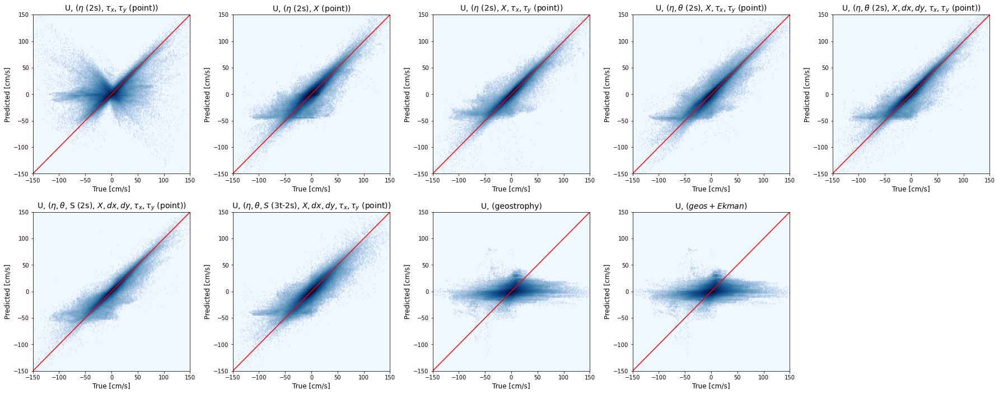

In [41]:
# fig, axs = plt.subplots(figsize=(24, 16), ncols=6, nrows=4)
fig = plt.figure(figsize=(25,10), tight_layout=True)
lim = 150
extent = (-lim, lim, -lim, lim)
for i, r in enumerate(['00','01','03','04','11','12','009']):
    plt.subplot(2,5,i+1)
    plt.hexbin(u_true_flat[r], u_pred_flat[r],
                  norm=LogNorm(), cmap=newcmp6,
              gridsize=200, extent=extent)
    plt.title('U, ('+ plabels[r]+')')
    plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
    plt.xlabel('True [cm/s]')
    plt.ylabel('Predicted [cm/s]')
    plt.xlim([-150,150])
    plt.ylim([-150,150])
plt.subplot(2,5,8)
plt.hexbin(u_true_flat['11'], ugflat,
              norm=LogNorm(), cmap=newcmp6,
          gridsize=200, extent=extent)
plt.title('U, (geostrophy)')
plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
plt.xlabel('True [cm/s]')
plt.ylabel('Predicted [cm/s]')
plt.xlim([-150,150])
plt.ylim([-150,150])


plt.subplot(2,5,9)
plt.hexbin(u_true_flat['11'], ugeflat,
              norm=LogNorm(), cmap=newcmp6,
          gridsize=200, extent=extent)
plt.title('U, $(geos+Ekman)$')
plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
plt.xlabel('True [cm/s]')
plt.ylabel('Predicted [cm/s]')
plt.xlim([-150,150])
plt.ylim([-150,150])




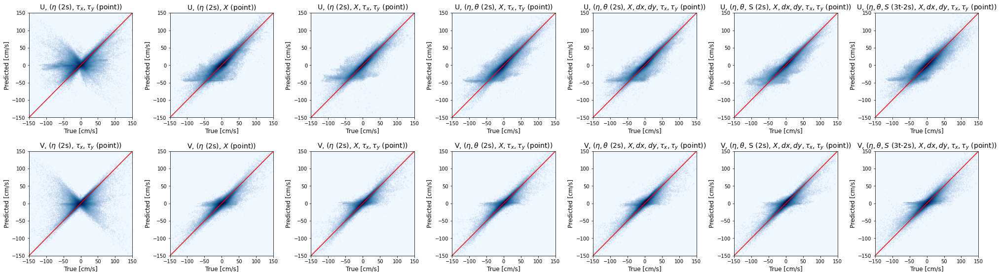

In [47]:
fig = plt.figure(figsize=(28,8), tight_layout=True)
lim = 150
extent = (-lim, lim, -lim, lim)
for i, r in enumerate(['00','01','03','04','11','12','009']):
    plt.subplot(2,7,i+1)
    plt.hexbin(u_true_flat[r], u_pred_flat[r],
                  norm=LogNorm(), cmap=newcmp6,
              gridsize=200, extent=extent)
    plt.title('U, ('+ plabels[r]+')')
    plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
    plt.xlabel('True [cm/s]')
    plt.ylabel('Predicted [cm/s]')
    plt.xlim([-150,150])
    plt.ylim([-150,150])

for i, r in enumerate(['00','01','03','04','11','12','009']):
    plt.subplot(2,7,i+8)
    plt.hexbin(v_true_flat[r], v_pred_flat[r],
                  norm=LogNorm(), cmap=newcmp6,
              gridsize=200, extent=extent)
    plt.title('V, ('+ plabels[r]+')')
    plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
    plt.xlabel('True [cm/s]')
    plt.ylabel('Predicted [cm/s]')
    plt.xlim([-150,150])
    plt.ylim([-150,150])




<ipython-input-31-372b1e8936de>:1: RuntimeWarning: Mean of empty slice
  U_e_zonmean = np.nanmean(U_e, axis = 1)
<ipython-input-31-372b1e8936de>:2: RuntimeWarning: Mean of empty slice
  V_e_zonmean = np.nanmean(V_e, axis = 1)
<ipython-input-31-372b1e8936de>:4: RuntimeWarning: Mean of empty slice
  U_r_zonmean = np.nanmean(U_true['06'] - U_g, axis = 1)
<ipython-input-31-372b1e8936de>:5: RuntimeWarning: Mean of empty slice
  V_r_zonmean = np.nanmean(V_true['06'] - V_g, axis = 1)


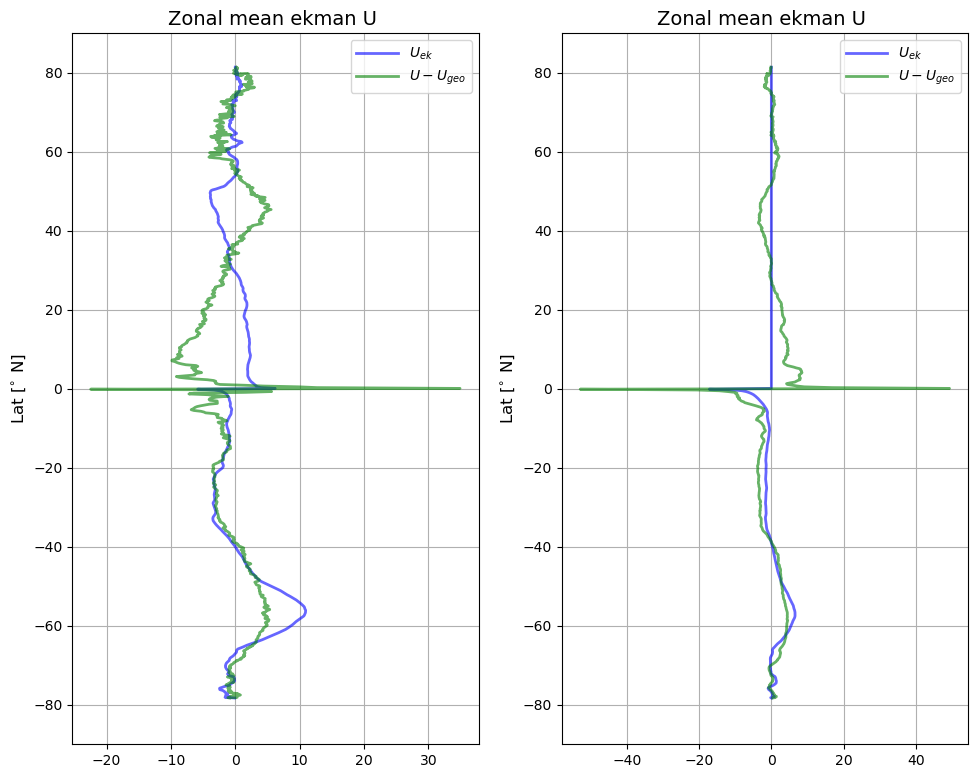

In [31]:
U_e_zonmean = np.nanmean(U_e, axis = 1)
V_e_zonmean = np.nanmean(V_e, axis = 1)

U_r_zonmean = np.nanmean(U_true['06'] - U_g, axis = 1)
V_r_zonmean = np.nanmean(V_true['06'] - V_g, axis = 1)

plt.figure(figsize=(10,8), dpi=100, tight_layout=True)

plt.subplot(121)

plt.plot(U_e_zonmean, YC_zonmean, linewidth=2, alpha = 0.6, color = 'b', label=r'$U_{ek}$');
plt.plot(U_r_zonmean, YC_zonmean, linewidth=2, alpha = 0.6, color = 'g', label=r'$U - U_{geo}$');

plt.ylabel(r'Lat [$^{\circ}$ N]')
plt.title('Zonal mean ekman U ')
plt.ylim([-90,90])
# plt.xlim([0,2])
plt.grid()
plt.legend(loc=1, fontsize=10)


plt.subplot(122)

plt.plot(V_e_zonmean, YC_zonmean, linewidth=2, alpha = 0.6, color = 'b', label=r'$U_{ek}$');
plt.plot(V_r_zonmean, YC_zonmean, linewidth=2, alpha = 0.6, color = 'g', label=r'$U - U_{geo}$');

plt.ylabel(r'Lat [$^{\circ}$ N]')
plt.title('Zonal mean ekman U ')
plt.ylim([-90,90])
# plt.xlim([0,2])
plt.grid()
plt.legend(loc=1, fontsize=10)


In [29]:
labels

{'00': 'SSH_2ps_pointTAUXTAUY_3l_402010_nf80',
 '01': 'SSH_2ps_pointX_3l_402010_nf80',
 '02': 'SSHSST_2ps_pointX_3l_402010_nf80',
 '03': 'SSH_2ps_pointXTAUXTAUY_3l_402010_nf80',
 '04': 'SSHSST_2ps_pointXTAUXTAUY_3l_402010_nf80',
 '05': 'SSHXYZ_2ps_pointTAUXTAUY_3l_402010_nf80',
 '06': 'SSHX_2ps_pointTAUXTAUY_3l_402010_nf80',
 '07': 'SSHSSTXYZ_2ps_pointTAUXTAUY_3l_402010_nf80',
 '08': 'SSHSSTX_2ps_pointTAUXTAUY_3l_402010_nf80',
 '09': 'SSHTAUXTAUY_2ps_pointX_3l_402010_nf80',
 '10': 'SSHSSTTAUXTAUY_2ps_pointX_3l_402010_nf80',
 '11': 'SSHSST_2ps_pointXdxdyTAUXTAUY_3l_402010_nf80',
 '12': 'SSHSSTSSS_2ps_pointXdxdyTAUXTAUY_3l_402010_nf80',
 '000': 'SSH_3pt2ps_pointXdxdyTAUXTAUY_3l_402010_nf80',
 '001': 'SSHSST_3pt2ps_pointXdxdyTAUXTAUY_3l_402010_nf80',
 '002': 'SSH_3pt2ps_pointXTAUXTAUY_3l_402010_nf80',
 '003': 'SSHSST_3pt2ps_pointXTAUXTAUY_3l_402010_nf80',
 '004': 'SSH_3pt2ps_pointXdxdy_3l_402010_nf80',
 '005': 'SSHSST_3pt2ps_pointXdxdy_3l_402010_nf80',
 '006': 'SSH_3pt2ps_pointX_3l_402010

In [30]:
U_ge = U_g + U_e
V_ge = V_g + V_e
targets_ge = np.stack([ugflat+ueflat, vgflat+veflat],axis=-1)
rms_err_zonmean_ge = np.nanmean(np.sqrt(unstack(np.sum((targets_true['06'] - targets_ge)**2, axis=1), 
                                                       ds.U.shape[1:], 2)),axis=1)
rel_rmse_mean = {}
for mn in rms_err_zonmean.keys():
    rel_rmse_mean[mn] = np.nanmean(np.where((YC_zonmean>5) | (YC_zonmean<-5) , rms_err_zonmean[mn]/rms_vel_zonmean[mn], np.nan))
rel_rmse_mean_ge = np.nanmean(np.where((YC_zonmean>5) | (YC_zonmean<-5) , rms_err_zonmean_ge/rms_vel_zonmean['06'], np.nan))
rel_rmse_mean_g = np.nanmean(np.where((YC_zonmean>5) | (YC_zonmean<-5) , rms_err_zonmean_g/rms_vel_zonmean['06'], np.nan))


<ipython-input-30-11a7f901c325>:4: RuntimeWarning: Mean of empty slice
  rms_err_zonmean_ge = np.nanmean(np.sqrt(unstack(np.sum((targets_true['06'] - targets_ge)**2, axis=1),


Text(0.5, 1.0, '$V_{geo+Ek}$')

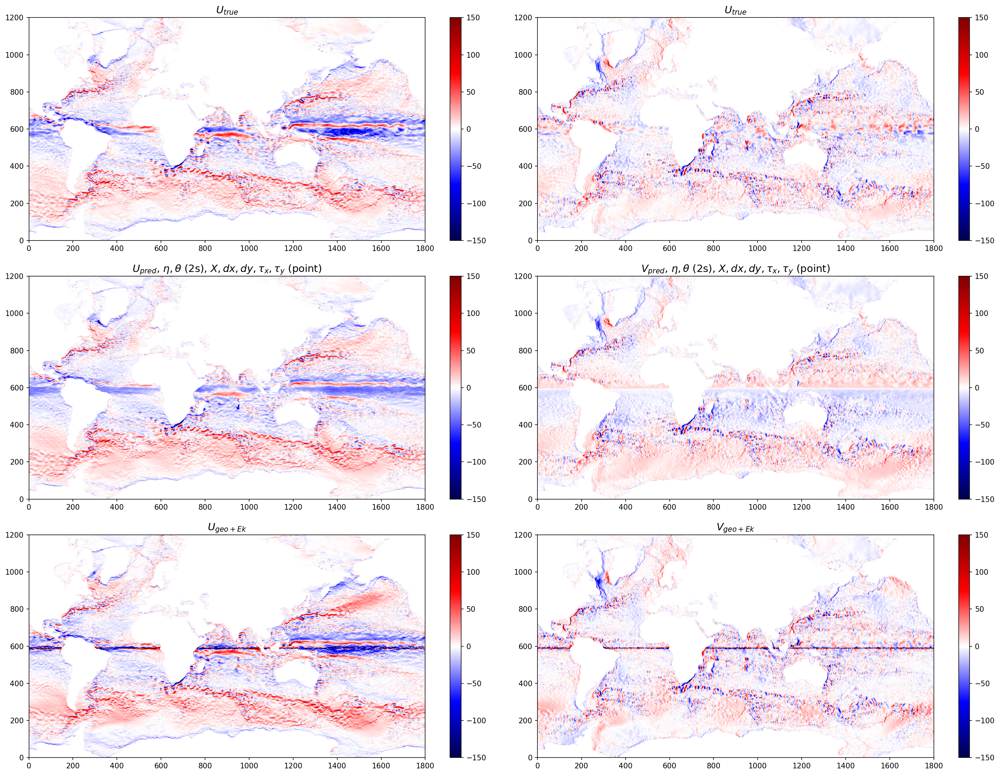

In [77]:
plt.figure(figsize=(20,15), dpi=150, tight_layout=True)
plt.subplot(321)
plt.pcolormesh(U_true['11'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
plt.title(r'$U_{true}$')

plt.subplot(322)
plt.pcolormesh(V_true['11'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
plt.title(r'$U_{true}$')

plt.subplot(323)
plt.pcolormesh(U_pred['11'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
plt.title(r'$U_{pred}$, '+ plabels['11'])

plt.subplot(324)
plt.pcolormesh(V_pred['11'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
plt.title(r'$V_{pred}$, '+ plabels['11'])

plt.subplot(325)
plt.pcolormesh(U_ge, cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
plt.title(r'$U_{geo+Ek}$')

plt.subplot(326)
plt.pcolormesh(V_ge, cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
plt.title(r'$V_{geo+Ek}$')



Text(0.5, 1.0, 'RMS velocity error(geo+Ekman)')

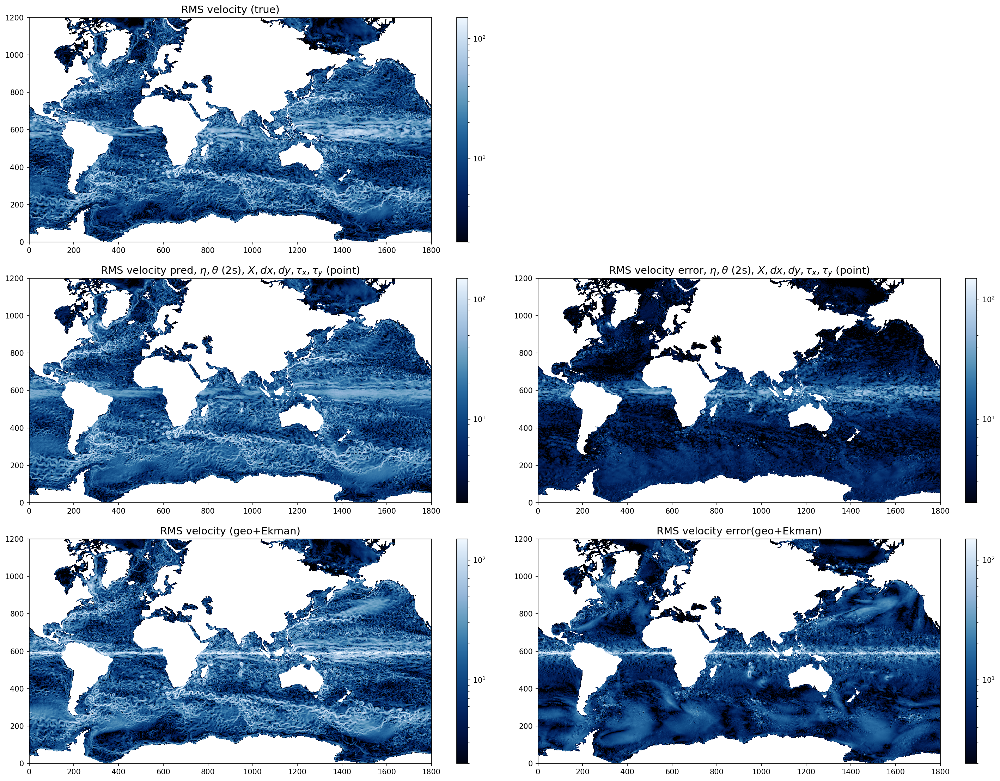

In [34]:
plt.figure(figsize=(20,15), dpi=150, tight_layout=True)
plt.subplot(321)
plt.pcolormesh(np.sqrt(U_true['11']**2 + V_true['11']**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
plt.title(r'RMS velocity (true)')

# plt.subplot(322)
# plt.pcolormesh(V_true['11'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# plt.title(r'$U_{true}$')

plt.subplot(323)
plt.pcolormesh(np.sqrt(U_pred['11']**2 + V_pred['11']**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
plt.title(r'RMS velocity pred, '+ plabels['11'])

plt.subplot(324)
plt.pcolormesh(np.sqrt(U_err['11']**2 + V_err['11']**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
plt.title(r'RMS velocity error, '+ plabels['11'])

plt.subplot(325)
plt.pcolormesh(np.sqrt(U_ge**2 + V_ge**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
plt.title(r'RMS velocity (geo+Ekman)')

plt.subplot(326)
plt.pcolormesh(np.sqrt((U_ge-U_true['11'])**2 + (V_ge-V_pred['11'])**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
plt.title(r'RMS velocity error(geo+Ekman)')



In [67]:
# plt.figure(figsize=(20,15), dpi=150, tight_layout=True)
# plt.subplot(321)
# plt.pcolormesh(U_true['009'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# plt.title(r'$U_{true}$')

# plt.subplot(322)
# plt.pcolormesh(V_true['009'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# plt.title(r'$U_{true}$')

# plt.subplot(323)
# plt.pcolormesh(U_pred['009'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# plt.title(r'$U_{pred}$, '+ plabels['009'])

# plt.subplot(324)
# plt.pcolormesh(V_pred['009'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# plt.title(r'$V_{pred}$, '+ plabels['009'])

# plt.subplot(325)
# plt.pcolormesh(U_ge, cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# plt.title(r'$U_{geo+Ek}$')

# plt.subplot(326)
# plt.pcolormesh(V_ge, cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# plt.title(r'$V_{geo+Ek}$')



In [68]:
# plt.figure(figsize=(20,15), dpi=150, tight_layout=True)
# plt.subplot(321)
# plt.pcolormesh(np.sqrt(U_true['009']**2 + V_true['009']**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
# plt.title(r'RMS velocity (true)')

# # plt.subplot(322)
# # plt.pcolormesh(V_true['11'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# # plt.title(r'$U_{true}$')

# plt.subplot(323)
# plt.pcolormesh(np.sqrt(U_pred['009']**2 + V_pred['009']**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
# plt.title(r'RMS velocity pred, '+ plabels['009'])

# plt.subplot(324)
# plt.pcolormesh(np.sqrt(U_err['009']**2 + V_err['009']**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
# plt.title(r'RMS velocity error, '+ plabels['009'])

# plt.subplot(325)
# plt.pcolormesh(np.sqrt(U_ge**2 + V_ge**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
# plt.title(r'RMS velocity (geo+Ekman)')

# plt.subplot(326)
# plt.pcolormesh(np.sqrt((U_ge-U_true['009'])**2 + (V_ge-V_pred['009'])**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
# plt.title(r'RMS velocity error(geo+Ekman)')



In [69]:
# plt.figure(figsize=(20,15), dpi=150, tight_layout=True)
# plt.subplot(321)
# plt.pcolormesh(U_true['05'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# plt.title(r'$U_{true}$')

# plt.subplot(322)
# plt.pcolormesh(V_true['05'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# plt.title(r'$U_{true}$')

# plt.subplot(323)
# plt.pcolormesh(U_pred['05'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# plt.title(r'$U_{pred}$, '+ plabels['05'])

# plt.subplot(324)
# plt.pcolormesh(V_pred['05'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# plt.title(r'$V_{pred}$, '+ plabels['05'])

# plt.subplot(325)
# plt.pcolormesh(U_ge, cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# plt.title(r'$U_{geo+Ek}$')

# plt.subplot(326)
# plt.pcolormesh(V_ge, cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# plt.title(r'$V_{geo+Ek}$')



In [70]:
# plt.figure(figsize=(20,15), dpi=150, tight_layout=True)
# plt.subplot(321)
# plt.pcolormesh(np.sqrt(U_true['05']**2 + V_true['05']**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
# plt.title(r'RMS velocity (true)')

# # plt.subplot(322)
# # plt.pcolormesh(V_true['11'], cmap='seismic', vmin=-150, vmax=150);plt.colorbar()
# # plt.title(r'$U_{true}$')

# plt.subplot(323)
# plt.pcolormesh(np.sqrt(U_pred['05']**2 + V_pred['05']**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
# plt.title(r'RMS velocity pred, '+ plabels['05'])

# plt.subplot(324)
# plt.pcolormesh(np.sqrt(U_err['05']**2 + V_err['05']**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
# plt.title(r'RMS velocity error, '+ plabels['05'])

# plt.subplot(325)
# plt.pcolormesh(np.sqrt(U_ge**2 + V_ge**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
# plt.title(r'RMS velocity (geo+Ekman)')

# plt.subplot(326)
# plt.pcolormesh(np.sqrt((U_ge-U_true['05'])**2 + (V_ge-V_pred['05'])**2) , norm=LogNorm(vmin=2, vmax=150), cmap=newcmp5, );plt.colorbar()
# plt.title(r'RMS velocity error(geo+Ekman)')



In [71]:
# plt.figure(figsize=(21,7), dpi=100, tight_layout=True)

# plt.subplot(141)
# for mnum in ['01','004','006']:
#     plt.plot(rms_err_zonmean[mnum]/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum]+', mean = %3.2f' %rel_rmse_mean[mnum] );
# plt.plot(rms_err_zonmean_g/rms_vel_zonmean[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' +', mean = %3.2f' %rel_rmse_mean_g );
# plt.plot(rms_err_zonmean_ge/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' +', mean = %3.2f' %rel_rmse_mean_ge );
# plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title('Zonal mean RMS error (normalized)')
# plt.xlabel(r'RMS error velocity ')
# plt.ylim([-90,90])
# plt.xlim([0,2.4])
# plt.grid()
# plt.legend(loc=1, fontsize=9, framealpha=0.5)

# plt.subplot(142)
# for mnum in ['00','03','05','06','09','000','002']:
#     plt.plot(rms_err_zonmean[mnum]/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum]+', mean = %3.2f' %rel_rmse_mean[mnum] );
# plt.plot(rms_err_zonmean_g/rms_vel_zonmean[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' +', mean = %3.2f' %rel_rmse_mean_g );
# plt.plot(rms_err_zonmean_ge/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' +', mean = %3.2f' %rel_rmse_mean_ge );
# # plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title('Zonal mean RMS error (normalized)')
# plt.xlabel(r'RMS error velocity ')
# plt.ylim([-90,90])
# plt.xlim([0,2.4])
# plt.grid()
# plt.legend(loc=1, fontsize=9, framealpha=0.5)

# plt.subplot(143)
# for mnum in ['02','005','007']:
#     plt.plot(rms_err_zonmean[mnum]/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum]+', mean = %3.2f' %rel_rmse_mean[mnum] );
# plt.plot(rms_err_zonmean_g/rms_vel_zonmean[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' +', mean = %3.2f' %rel_rmse_mean_g );
# plt.plot(rms_err_zonmean_ge/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' +', mean = %3.2f' %rel_rmse_mean_ge );
# # plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title('Zonal mean RMS error (normalized)')
# plt.xlabel(r'RMS error velocity ')
# plt.ylim([-90,90])
# plt.xlim([0,2.4])
# plt.grid()
# plt.legend(loc=1, fontsize=9, framealpha=0.5)


# plt.subplot(144)
# for mnum in ['04','07','08', '10', '11','001','003','008','009']:
#     plt.plot(rms_err_zonmean[mnum]/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum]+', mean = %3.2f' %rel_rmse_mean[mnum] );
# plt.plot(rms_err_zonmean_g/rms_vel_zonmean[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' +', mean = %3.2f' %rel_rmse_mean_g );
# plt.plot(rms_err_zonmean_ge/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' +', mean = %3.2f' %rel_rmse_mean_ge );
# # plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title('Zonal mean RMS error (normalized)')
# plt.xlabel(r'RMS error velocity ')
# plt.ylim([-90,90])
# plt.xlim([0,2.4])
# plt.grid()
# plt.legend(loc=1, fontsize=9, framealpha=0.5)


In [72]:
# plt.figure(figsize=(21,7), dpi=100, tight_layout=True)

# plt.subplot(141)
# for mnum in ['01','004','006']:
#     plt.plot(rms_err_zonmean[mnum]/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum]);
# plt.plot(rms_err_zonmean_g/rms_vel_zonmean[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' );
# plt.plot(rms_err_zonmean_ge/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' );
# plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title('Zonal mean RMS error (normalized)')
# plt.xlabel(r'RMS error velocity ')
# plt.ylim([-90,90])
# plt.xlim([0,2.2])
# plt.grid()
# plt.legend(loc=0, fontsize=9, framealpha=0.5)

# plt.subplot(142)
# for mnum in ['00','03','05','06','09','000','002']:
#     plt.plot(rms_err_zonmean[mnum]/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] );
# plt.plot(rms_err_zonmean_g/rms_vel_zonmean[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy'  );
# plt.plot(rms_err_zonmean_ge/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' );
# # plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title('Zonal mean RMS error (normalized)')
# plt.xlabel(r'RMS error velocity ')
# plt.ylim([-90,90])
# plt.xlim([0,2.2])
# plt.grid()
# plt.legend(loc=0, fontsize=9, framealpha=0.5)

# plt.subplot(143)
# for mnum in ['02','005','007']:
#     plt.plot(rms_err_zonmean[mnum]/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] );
# plt.plot(rms_err_zonmean_g/rms_vel_zonmean[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy'  );
# plt.plot(rms_err_zonmean_ge/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' );
# # plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title('Zonal mean RMS error (normalized)')
# plt.xlabel(r'RMS error velocity ')
# plt.ylim([-90,90])
# plt.xlim([0,2.2])
# plt.grid()
# plt.legend(loc=0, fontsize=9, framealpha=0.5)


# plt.subplot(144)
# for mnum in ['04','07','08', '10', '11','001','003','008','009']:
#     plt.plot(rms_err_zonmean[mnum]/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] );
# plt.plot(rms_err_zonmean_g/rms_vel_zonmean[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy'  );
# plt.plot(rms_err_zonmean_ge/rms_vel_zonmean[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' );
# # plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title('Zonal mean RMS error (normalized)')
# plt.xlabel(r'RMS error velocity')
# plt.ylim([-90,90])
# plt.xlim([0,2.2])
# plt.grid()
# plt.legend(loc=0, fontsize=9, framealpha=0.5)


In [33]:
rms_err_zonmean_m = {}
rms_vel_zonmean_m = {}
rel_rmse_mean_m = {}

rms_err_zonmean_ge_m = np.where((YC_zonmean>5) | ((YC_zonmean<-5) & (YC_zonmean>-77.5)) , rms_err_zonmean_ge, np.nan)
rms_err_zonmean_g_m = np.where((YC_zonmean>5) | ((YC_zonmean<-5) & (YC_zonmean>-77.5)) , rms_err_zonmean_g, np.nan)

for r in rms_err_zonmean.keys():
    rms_vel_zonmean_m[r] = np.where((YC_zonmean>5) | ((YC_zonmean<-5) & (YC_zonmean>-77.5)) , rms_vel_zonmean[r], np.nan)
    rms_err_zonmean_m[r] = np.where((YC_zonmean>5) | ((YC_zonmean<-5) & (YC_zonmean>-77.5)) , rms_err_zonmean[r], np.nan)
    rel_rmse_mean_m[r] = np.nanmean(rms_err_zonmean_m[r] /rms_vel_zonmean_m[r])

rel_rmse_mean_ge_m = np.nanmean(rms_err_zonmean_ge_m/rms_vel_zonmean_m['06'])
rel_rmse_mean_g_m = np.nanmean(rms_err_zonmean_g_m/rms_vel_zonmean_m['06'])


In [34]:
rmse_mean_m = {}

rmse_mean_ge_m = np.nanmean(rms_err_zonmean_ge_m)
rmse_mean_g_m = np.nanmean(rms_err_zonmean_g_m)

for r in rms_err_zonmean.keys():
    rmse_mean_m[r] = np.nanmean(rms_err_zonmean_m[r])


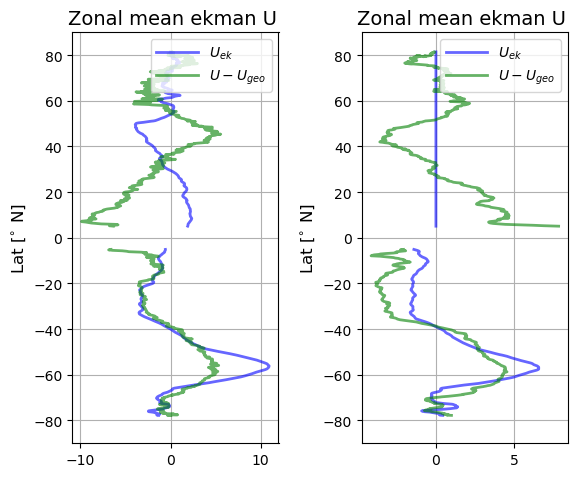

In [35]:
U_e_zonmean_m = np.where((YC_zonmean>5) | ((YC_zonmean<-5) & (YC_zonmean>-77.8)) , U_e_zonmean, np.nan)
U_r_zonmean_m = np.where((YC_zonmean>5) | ((YC_zonmean<-5) & (YC_zonmean>-77.8)) , U_r_zonmean, np.nan)

V_e_zonmean_m = np.where((YC_zonmean>5) | ((YC_zonmean<-5) & (YC_zonmean>-77.8)) , V_e_zonmean, np.nan)
V_r_zonmean_m = np.where((YC_zonmean>5) | ((YC_zonmean<-5) & (YC_zonmean>-77.8)) , V_r_zonmean, np.nan)

plt.figure(figsize=(6,5), dpi=100, tight_layout=True)

plt.subplot(121)

plt.plot(U_e_zonmean_m, YC_zonmean, linewidth=2, alpha = 0.6, color = 'b', label=r'$U_{ek}$');
plt.plot(U_r_zonmean_m, YC_zonmean, linewidth=2, alpha = 0.6, color = 'g', label=r'$U - U_{geo}$');

plt.ylabel(r'Lat [$^{\circ}$ N]')
plt.title('Zonal mean ekman U ')
plt.ylim([-90,90])
# plt.xlim([0,2])
plt.grid()
plt.legend(loc=1, fontsize=10)


plt.subplot(122)

plt.plot(V_e_zonmean_m, YC_zonmean, linewidth=2, alpha = 0.6, color = 'b', label=r'$U_{ek}$');
plt.plot(V_r_zonmean_m, YC_zonmean, linewidth=2, alpha = 0.6, color = 'g', label=r'$U - U_{geo}$');

plt.ylabel(r'Lat [$^{\circ}$ N]')
plt.title('Zonal mean ekman U ')
plt.ylim([-90,90])
# plt.xlim([0,2])
plt.grid()
plt.legend(loc=1, fontsize=10)


In [73]:
# plt.figure(figsize=(21,7), dpi=100, tight_layout=True)

# plt.subplot(141)
# for mnum in ['01','004','006']:
#     plt.plot(rms_err_zonmean_m[mnum]/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum]+', mean = %3.2f' %rel_rmse_mean_m[mnum] );
# plt.plot(rms_err_zonmean_g_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' +', mean = %3.2f' %rel_rmse_mean_g_m );
# plt.plot(rms_err_zonmean_ge_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' +', mean = %3.2f' %rel_rmse_mean_ge_m );
# plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title(r'Zonal mean RMS error, M(SSH, space)')
# plt.xlabel(r'RMS error velocity (normalized)')
# plt.ylim([-90,90])
# plt.xlim([0,2.4])
# plt.grid()
# plt.legend(loc=1, fontsize=9, framealpha=0.5)

# plt.subplot(142)
# for mnum in ['00','03','05','06','09','000','002']:
#     plt.plot(rms_err_zonmean_m[mnum]/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum]+', mean = %3.2f' %rel_rmse_mean_m[mnum] );
# plt.plot(rms_err_zonmean_g_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' +', mean = %3.2f' %rel_rmse_mean_g_m );
# plt.plot(rms_err_zonmean_ge_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' +', mean = %3.2f' %rel_rmse_mean_ge_m );
# # plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title(r'Zonal mean RMS error, M(SSH, wind)')
# plt.xlabel(r'RMS error velocity (normalized)')
# plt.ylim([-90,90])
# plt.xlim([0,2.4])
# plt.grid()
# plt.legend(loc=1, fontsize=9, framealpha=0.5)

# plt.subplot(143)
# for mnum in ['02','005','007']:
#     plt.plot(rms_err_zonmean_m[mnum]/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum]+', mean = %3.2f' %rel_rmse_mean_m[mnum] );
# plt.plot(rms_err_zonmean_g_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' +', mean = %3.2f' %rel_rmse_mean_g_m );
# plt.plot(rms_err_zonmean_ge_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' +', mean = %3.2f' %rel_rmse_mean_ge_m );
# # plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title(r'Zonal mean RMS error, M(SSH, SST, space)')
# plt.xlabel(r'RMS error velocity (normalized)' )
# plt.ylim([-90,90])
# plt.xlim([0,2.4])
# plt.grid()
# plt.legend(loc=1, fontsize=9, framealpha=0.5)


# plt.subplot(144)
# for mnum in ['04','07','08', '10', '11','001','003','008','009']:
#     plt.plot(rms_err_zonmean_m[mnum]/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum]+', mean = %3.2f' %rel_rmse_mean_m[mnum] );
# plt.plot(rms_err_zonmean_g_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' +', mean = %3.2f' %rel_rmse_mean_g_m );
# plt.plot(rms_err_zonmean_ge_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' +', mean = %3.2f' %rel_rmse_mean_ge_m );
# # plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title(r'Zonal mean RMS error, M(SSH, SST, space, wind)')
# plt.xlabel(r'RMS error velocity (normalized)')
# plt.ylim([-90,90])
# plt.xlim([0,2.4])
# plt.grid()
# plt.legend(loc=1, fontsize=9, framealpha=0.5)


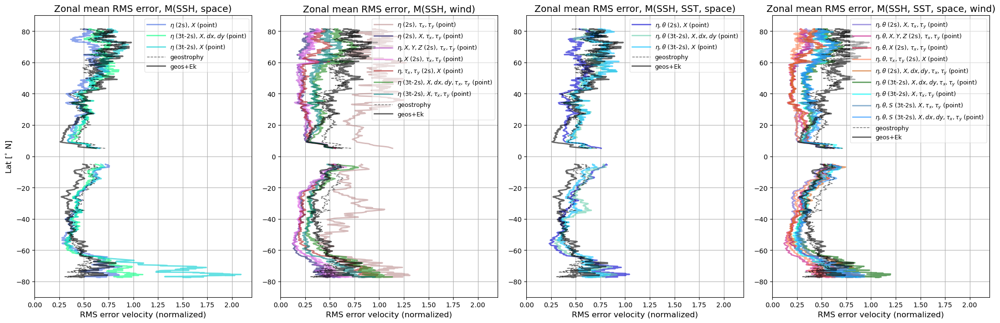

In [65]:
plt.figure(figsize=(21,7), dpi=100, tight_layout=True)

plt.subplot(141)
for mnum in ['01','004','006']:
    plt.plot(rms_err_zonmean_m[mnum]/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] );
plt.plot(rms_err_zonmean_g_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' );
plt.plot(rms_err_zonmean_ge_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek'  );
plt.ylabel(r'Lat [$^{\circ}$ N]')
plt.title(r'Zonal mean RMS error, M(SSH, space)')
plt.xlabel(r'RMS error velocity (normalized)')
plt.ylim([-90,90])
plt.xlim([0,2.2])
plt.grid()
plt.legend(loc=1, fontsize=9, framealpha=0.5)

plt.subplot(142)
for mnum in ['00','03','05','06','09','000','002']:
    plt.plot(rms_err_zonmean_m[mnum]/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] );
plt.plot(rms_err_zonmean_g_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy'  );
plt.plot(rms_err_zonmean_ge_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek'  );
# plt.ylabel(r'Lat [$^{\circ}$ N]')
plt.title(r'Zonal mean RMS error, M(SSH, wind)')
plt.xlabel(r'RMS error velocity (normalized)')
plt.ylim([-90,90])
plt.xlim([0,2.2])
plt.grid()
plt.legend(loc=1, fontsize=9, framealpha=0.5)

plt.subplot(143)
for mnum in ['02','005','007']:
    plt.plot(rms_err_zonmean_m[mnum]/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] );
plt.plot(rms_err_zonmean_g_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy'  );
plt.plot(rms_err_zonmean_ge_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' );
# plt.ylabel(r'Lat [$^{\circ}$ N]')
plt.title(r'Zonal mean RMS error, M(SSH, SST, space)')
plt.xlabel(r'RMS error velocity (normalized)' )
plt.ylim([-90,90])
plt.xlim([0,2.2])
plt.grid()
plt.legend(loc=1, fontsize=9, framealpha=0.5)


plt.subplot(144)
for mnum in ['04','07','08', '10', '11','001','003','008','009']:
    plt.plot(rms_err_zonmean_m[mnum]/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] );
plt.plot(rms_err_zonmean_g_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' );
plt.plot(rms_err_zonmean_ge_m/rms_vel_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek'  );
# plt.ylabel(r'Lat [$^{\circ}$ N]')
plt.title(r'Zonal mean RMS error, M(SSH, SST, space, wind)')
plt.xlabel(r'RMS error velocity (normalized)')
plt.ylim([-90,90])
plt.xlim([0,2.2])
plt.grid()
plt.legend(loc=1, fontsize=9, framealpha=0.5)


In [74]:
# plt.figure(figsize=(21,7), dpi=100, tight_layout=True)

# plt.subplot(141)
# for mnum in ['01','004','006']:
#     plt.plot(rms_err_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] );
# plt.plot(rms_err_zonmean_g_m, YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' );
# plt.plot(rms_err_zonmean_ge_m, YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek'  );
# plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title(r'Zonal mean RMS error, M(SSH, space)')
# plt.xlabel(r'RMS error velocity [$cm/s$]')
# plt.ylim([-90,90])
# plt.xlim([0,30])
# plt.grid()
# plt.legend(loc=1, fontsize=9, framealpha=0.5)

# plt.subplot(142)
# for mnum in ['00','03','05','06','09','000','002']:
#     plt.plot(rms_err_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] );
# plt.plot(rms_err_zonmean_g_m, YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy'  );
# plt.plot(rms_err_zonmean_ge_m, YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek'  );
# # plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title(r'Zonal mean RMS error, M(SSH, wind)')
# plt.xlabel(r'RMS error velocity [$cm/s$]')
# plt.ylim([-90,90])
# plt.xlim([0,30])
# plt.grid()
# plt.legend(loc=1, fontsize=9, framealpha=0.5)

# plt.subplot(143)
# for mnum in ['02','005','007']:
#     plt.plot(rms_err_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] );
# plt.plot(rms_err_zonmean_g_m, YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy'  );
# plt.plot(rms_err_zonmean_ge_m, YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek' );
# # plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title(r'Zonal mean RMS error, M(SSH, SST, space)')
# plt.xlabel(r'RMS error velocity [$cm/s$]')
# plt.ylim([-90,90])
# # plt.xlim([0,2.4])
# plt.grid()
# plt.legend(loc=1, fontsize=9, framealpha=0.5)


# plt.subplot(144)
# for mnum in ['04','07','08', '10', '11','001','003','008','009']:
#     plt.plot(rms_err_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] );
# plt.plot(rms_err_zonmean_g_m, YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' );
# plt.plot(rms_err_zonmean_ge_m, YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek'  );
# # plt.ylabel(r'Lat [$^{\circ}$ N]')
# plt.title(r'Zonal mean RMS error, M(SSH, SST, space, wind)')
# plt.xlabel(r'RMS error velocity [$cm/s$]')
# plt.ylim([-90,90])
# plt.xlim([0,30])
# plt.grid()
# plt.legend(loc=1, fontsize=9, framealpha=0.5)


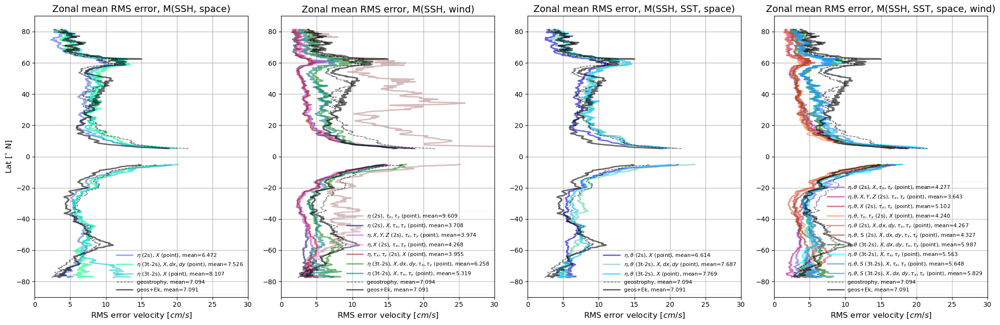

In [52]:
plt.figure(figsize=(21,7), dpi=100, tight_layout=True)

plt.subplot(141)
for mnum in ['01','004','006']:
    plt.plot(rms_err_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] +', mean=%3.3f' %rmse_mean_m[mnum] );
plt.plot(rms_err_zonmean_g_m, YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' +', mean=%3.3f' %rmse_mean_g_m );
plt.plot(rms_err_zonmean_ge_m, YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek'  +', mean=%3.3f' %rmse_mean_ge_m );
plt.ylabel(r'Lat [$^{\circ}$ N]')
plt.title(r'Zonal mean RMS error, M(SSH, space)')
plt.xlabel(r'RMS error velocity [$cm/s$]')
plt.ylim([-90,90])
plt.xlim([0,30])
plt.grid()
plt.legend(loc=0, fontsize=8, framealpha=0.2)

plt.subplot(142)
for mnum in ['00','03','05','06','09','000','002']:
    plt.plot(rms_err_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] +', mean=%3.3f' %rmse_mean_m[mnum] );
plt.plot(rms_err_zonmean_g_m, YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy'  +', mean=%3.3f' %rmse_mean_g_m );
plt.plot(rms_err_zonmean_ge_m, YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek'  +', mean=%3.3f' %rmse_mean_ge_m );
# plt.ylabel(r'Lat [$^{\circ}$ N]')
plt.title(r'Zonal mean RMS error, M(SSH, wind)')
plt.xlabel(r'RMS error velocity [$cm/s$]')
plt.ylim([-90,90])
plt.xlim([0,30])
plt.grid()
plt.legend(loc=0, fontsize=8, framealpha=0.2)

plt.subplot(143)
for mnum in ['02','005','007']:
    plt.plot(rms_err_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] +', mean=%3.3f' %rmse_mean_m[mnum] );
plt.plot(rms_err_zonmean_g_m, YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy'  +', mean=%3.3f' %rmse_mean_g_m );
plt.plot(rms_err_zonmean_ge_m, YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek'  +', mean=%3.3f' %rmse_mean_ge_m);
# plt.ylabel(r'Lat [$^{\circ}$ N]')
plt.title(r'Zonal mean RMS error, M(SSH, SST, space)')
plt.xlabel(r'RMS error velocity [$cm/s$]')
plt.ylim([-90,90])
plt.xlim([0,30])
plt.grid()
plt.legend(loc=0, fontsize=8, framealpha=0.2)


plt.subplot(144)
for mnum in ['04','07','08', '10', '11','12','001','003','008','009']:
    plt.plot(rms_err_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = plabels[mnum] +', mean=%3.3f' %rmse_mean_m[mnum] );
plt.plot(rms_err_zonmean_g_m, YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'geostrophy' +', mean=%3.3f' %rmse_mean_g_m);
plt.plot(rms_err_zonmean_ge_m, YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'geos+Ek'  +', mean=%3.3f' %rmse_mean_ge_m );
# plt.ylabel(r'Lat [$^{\circ}$ N]')
plt.title(r'Zonal mean RMS error, M(SSH, SST, space, wind)')
plt.xlabel(r'RMS error velocity [$cm/s$]')
plt.ylim([-90,90])
plt.xlim([0,30])
plt.grid()
plt.legend(loc=0, fontsize=8, framealpha=0.2, )


In [75]:
# ## Plot skill as a function of feature
# plt.figure(figsize=(12,8), dpi=100, tight_layout=True)
# plt.plot(0, rmse_mean_ge_m, '^' ,color='k',  markersize=8, alpha=0.7, label = 'geostrophy')
# plt.plot(0, rmse_mean_g_m, 'v', color='gray', markersize=8, alpha=0.75, label = 'geostrophy + Ekman')

# for r in ['01','004','006']:
#     plt.plot(1, rmse_mean_m[r], 'o', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

# for r in ['00','03','05','06','09','000','002']:
#     plt.plot(2, rmse_mean_m[r], 'p', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

    
# for r in ['02','005','007']:
#     plt.plot(3, rmse_mean_m[r], 'd', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

# for r in ['04','07','08', '10', '11','12','001','003','008','009']:
#     plt.plot(4, rmse_mean_m[r], '*', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

# plt.legend(fontsize=9, loc='lower left')
# plt.ylim([3,12])
# plt.xlim([-2,4.5])
# plt.xticks([0,1,2,3,4], ['Physical', 'M(SSH, space)', 'M(SSH, wind)', 'M(SSH, SST, space)', 'M(SSH, SST, space, wind)'])
# plt.grid()
# plt.title('Model error(feature)')
# plt.ylabel(r'Model predicted rms error $[cm/s]$')

Text(0, 0.5, 'Model predicted rms error $[cm/s]$')

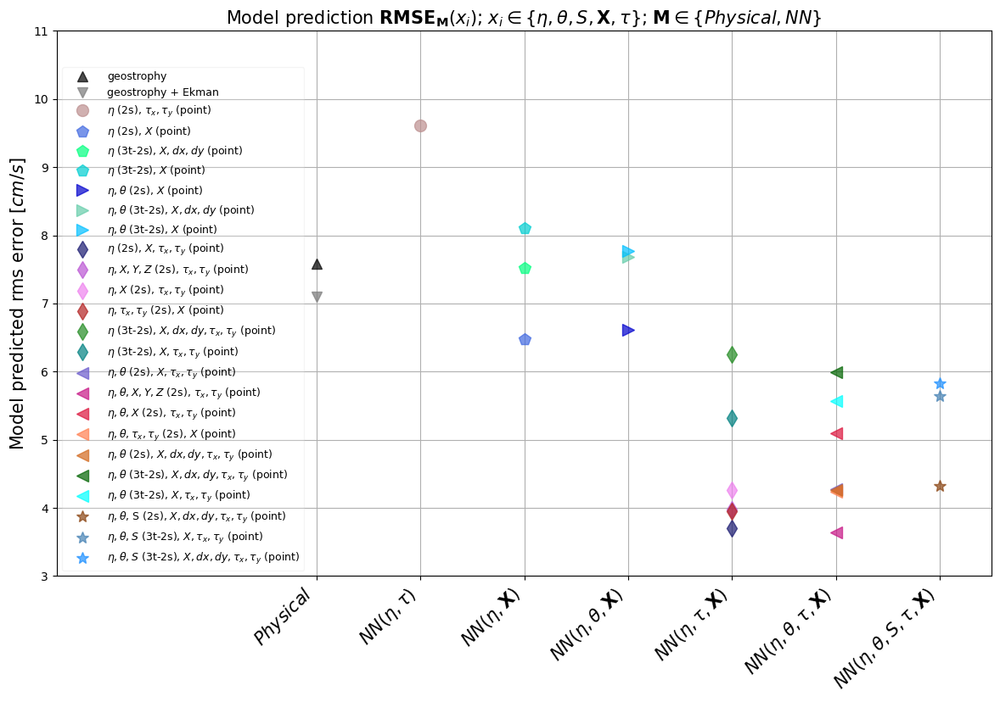

In [49]:
## Plot skill as a function of feature
plt.figure(figsize=(12,8.5), dpi=100, tight_layout=True)
plt.plot(0, rmse_mean_ge_m, '^' ,color='k',  markersize=8, alpha=0.7, label = 'geostrophy')
plt.plot(0, rmse_mean_g_m, 'v', color='gray', markersize=8, alpha=0.75, label = 'geostrophy + Ekman')

for r in ['00',]:
    plt.plot(1, rmse_mean_m[r], 'o', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['01','004','006']:
    plt.plot(2, rmse_mean_m[r], 'p', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['02','005','007']:
    plt.plot(3, rmse_mean_m[r], '>', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['03','05','06','09','000','002']:
    plt.plot(4, rmse_mean_m[r], 'd', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])


for r in ['04','07','08', '10', '11','001','003',]:
    plt.plot(5, rmse_mean_m[r], '<', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['12','008','009']:
    plt.plot(6, rmse_mean_m[r], '*', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

plt.legend(fontsize=9, loc='lower left', framealpha=0.2)
plt.ylim([3,11])
plt.xlim([-2.5,6.5])
plt.xticks([0,1,2,3,4,5,6], 
           [r'$Physical$', 
            r'$NN(\eta, \tau)$', 
            r'$NN(\eta, \mathbf{X})$', 
            r'$NN(\eta, \theta, \mathbf{X})$', 
            r'$NN(\eta, \tau, \mathbf{X})$', 
            r'$NN(\eta, \theta, \tau ,\mathbf{X})$', 
            r'$NN(\eta, \theta, S, \tau ,\mathbf{X})$', ], fontsize=15, rotation=45, ha="right")
plt.grid()
plt.title(r'Model prediction $\mathbf{RMSE}_{\mathbf{M}}(x_i)$; $x_i \in \{\eta, \theta, S, \mathbf{X}, \tau \}$; $\mathbf{M} \in \{Physical, NN\}$', fontsize=15)
plt.ylabel(r'Model predicted rms error $[cm/s]$', fontsize=15)

In [50]:
labels

{'00': 'SSH_2ps_pointTAUXTAUY_3l_402010_nf80',
 '01': 'SSH_2ps_pointX_3l_402010_nf80',
 '02': 'SSHSST_2ps_pointX_3l_402010_nf80',
 '03': 'SSH_2ps_pointXTAUXTAUY_3l_402010_nf80',
 '04': 'SSHSST_2ps_pointXTAUXTAUY_3l_402010_nf80',
 '05': 'SSHXYZ_2ps_pointTAUXTAUY_3l_402010_nf80',
 '06': 'SSHX_2ps_pointTAUXTAUY_3l_402010_nf80',
 '07': 'SSHSSTXYZ_2ps_pointTAUXTAUY_3l_402010_nf80',
 '08': 'SSHSSTX_2ps_pointTAUXTAUY_3l_402010_nf80',
 '09': 'SSHTAUXTAUY_2ps_pointX_3l_402010_nf80',
 '10': 'SSHSSTTAUXTAUY_2ps_pointX_3l_402010_nf80',
 '11': 'SSHSST_2ps_pointXdxdyTAUXTAUY_3l_402010_nf80',
 '12': 'SSHSSTSSS_2ps_pointXdxdyTAUXTAUY_3l_402010_nf80',
 '000': 'SSH_3pt2ps_pointXdxdyTAUXTAUY_3l_402010_nf80',
 '001': 'SSHSST_3pt2ps_pointXdxdyTAUXTAUY_3l_402010_nf80',
 '002': 'SSH_3pt2ps_pointXTAUXTAUY_3l_402010_nf80',
 '003': 'SSHSST_3pt2ps_pointXTAUXTAUY_3l_402010_nf80',
 '004': 'SSH_3pt2ps_pointXdxdy_3l_402010_nf80',
 '005': 'SSHSST_3pt2ps_pointXdxdy_3l_402010_nf80',
 '006': 'SSH_3pt2ps_pointX_3l_402010

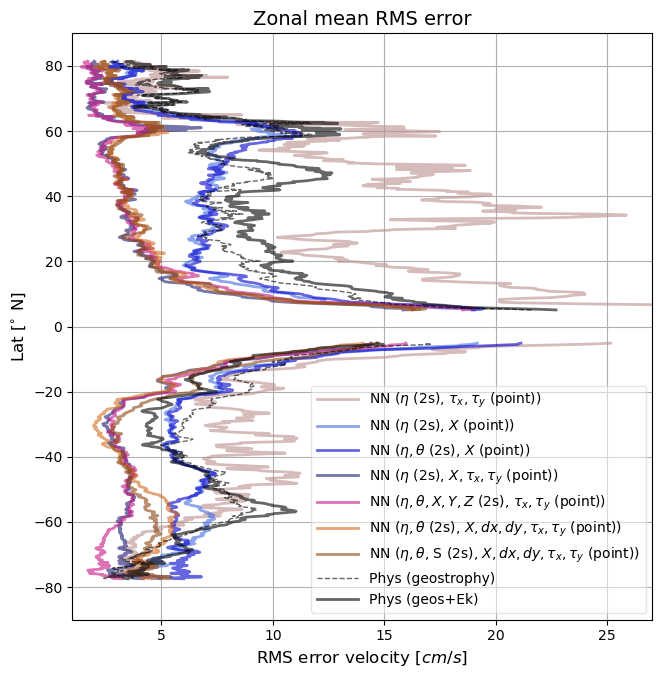

In [60]:
plt.figure(figsize=(7,7), dpi=100, tight_layout=True)

for mnum in ['00','01','02','03','07','11','12',]:
    plt.plot(rms_err_zonmean_m[mnum], YC_zonmean, linewidth=2, alpha = 0.6, color = colors[mnum], label = 'NN (%s)' %plabels[mnum] );
plt.plot(rms_err_zonmean_g_m, YC_zonmean, linewidth=1, linestyle='dashed', alpha = 0.6, color = 'k', label = 'Phys (geostrophy)' );
plt.plot(rms_err_zonmean_ge_m, YC_zonmean, linewidth=2, alpha = 0.6, color = 'k', label = 'Phys (geos+Ek)'  );
plt.ylabel(r'Lat [$^{\circ}$ N]')
plt.title(r'Zonal mean RMS error')
plt.xlabel(r'RMS error velocity [$cm/s$]')
plt.ylim([-90,90])
plt.xlim([1,27])
plt.grid()
plt.legend(bbox_to_anchor=(0.4, 0., 0.5, 0.5), fontsize=10, framealpha=0.5)




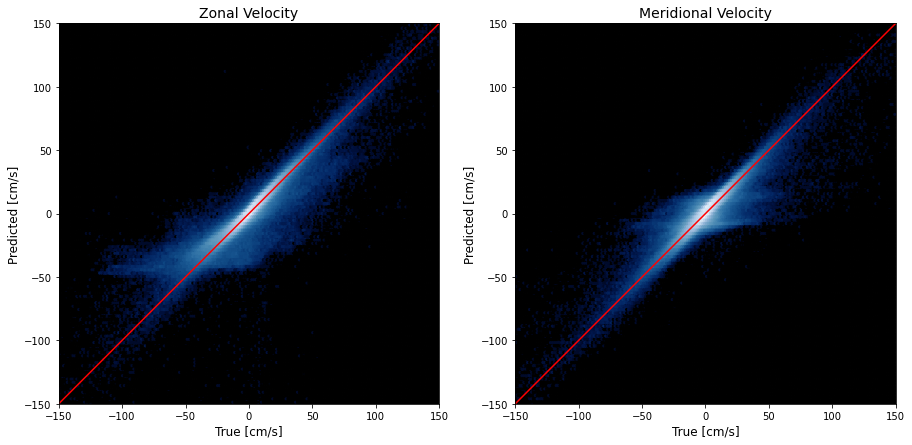

In [46]:
fig, axs = plt.subplots(figsize=(15, 7), ncols=2)

lim = 150
extent = (-lim, lim, -lim, lim)

axs[0].hexbin(u_true_flat['11'], u_pred_flat['11'],
              norm=LogNorm(), cmap=newcmp5,
              gridsize=200, extent=extent)
axs[0].set_title('Zonal Velocity')

axs[1].hexbin(v_true_flat['11'], v_pred_flat['11'],
              norm=LogNorm(), cmap=newcmp5,
              gridsize=200, extent=extent)
axs[1].set_title('Meridional Velocity')

for ax in axs:
    ax.plot([-lim, lim], [-lim, lim], color='r')
    ax.set_aspect('equal')
    ax.set_xlabel('True [cm/s]')
    ax.set_ylabel('Predicted [cm/s]')
    ax.set_xlim([-150,150])
    ax.set_ylim([-150,150])


In [63]:
# fig, axs = plt.subplots(figsize=(15, 7), ncols=2)

# lim = 150
# extent = (-lim, lim, -lim, lim)

# axs[0].hexbin(u_true_flat['11'], u_pred_flat['11'],
#               norm=LogNorm(), cmap=newcmp6,
#               gridsize=200, extent=extent)
# axs[0].set_title('Zonal Velocity')

# axs[1].hexbin(v_true_flat['11'], v_pred_flat['11'],
#               norm=LogNorm(), cmap=newcmp6,
#               gridsize=200, extent=extent)
# axs[1].set_title('Meridional Velocity')

# for ax in axs:
#     ax.plot([-lim, lim], [-lim, lim], color='r')
#     ax.set_aspect('equal')
#     ax.set_xlabel('True [cm/s]')
#     ax.set_ylabel('Predicted [cm/s]')
#     ax.set_xlim([-150,150])
#     ax.set_ylim([-150,150])


In [61]:
# # fig, axs = plt.subplots(figsize=(24, 16), ncols=6, nrows=4)
# fig = plt.figure(figsize=(30,20), tight_layout=True)
# lim = 150
# extent = (-lim, lim, -lim, lim)
# for i, r in enumerate(u_pred_flat.keys()):
#     plt.subplot(4,6,i+1)
#     plt.hexbin(u_true_flat[r], u_pred_flat[r],
#                   norm=LogNorm(), cmap=newcmp6,
#               gridsize=200, extent=extent)
#     plt.title('U, ('+ plabels[r]+')')
#     plt.plot([-lim, lim], [-lim, lim], color='r')
# #     plt.aspect('equal')
#     plt.xlabel('True [cm/s]')
#     plt.ylabel('Predicted [cm/s]')
#     plt.xlim([-150,150])
#     plt.ylim([-150,150])

In [62]:
# # fig, axs = plt.subplots(figsize=(24, 16), ncols=6, nrows=4)
# fig = plt.figure(figsize=(30,20), tight_layout=True)
# lim = 150
# extent = (-lim, lim, -lim, lim)
# for i, r in enumerate(v_pred_flat.keys()):
#     plt.subplot(4,6,i+1)
#     plt.hexbin(v_true_flat[r], v_pred_flat[r],
#                   norm=LogNorm(), cmap=newcmp6,
#               gridsize=200, extent=extent)
#     plt.title('V, ('+ plabels[r]+')')
#     plt.plot([-lim, lim], [-lim, lim], color='r')
# #     plt.aspect('equal')
#     plt.xlabel('True [cm/s]')
#     plt.ylabel('Predicted [cm/s]')
#     plt.xlim([-150,150])
#     plt.ylim([-150,150])

In [44]:
colors

{'00': 'rosybrown',
 '01': 'royalblue',
 '02': 'mediumblue',
 '03': 'midnightblue',
 '04': 'slateblue',
 '05': 'mediumorchid',
 '06': 'violet',
 '07': 'mediumvioletred',
 '08': 'crimson',
 '09': 'firebrick',
 '10': 'coral',
 '11': 'saddlebrown',
 '000': 'forestgreen',
 '001': 'darkgreen',
 '002': 'teal',
 '003': 'aqua',
 '004': 'springgreen',
 '005': 'mediumaquamarine',
 '006': 'darkturquoise',
 '007': 'deepskyblue',
 '008': 'steelblue',
 '009': 'dodgerblue'}

In [64]:
# fig = plt.figure(figsize=(14,14), tight_layout=True, dpi=150, )
# for r in ['01','004','006']:
#     plt.subplot(431)
#     plt.plot(history_all[r]['losses'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(loss_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel(r'batch');
#     plt.ylabel('Mean Absolute Error');
#     plt.xlim([0,1690])
#     plt.ylim([2,12])
# #     plt.grid()
    
#     plt.subplot(432)
#     plt.plot(history_all[r]['mse'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(mse_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel(r'Mean Squared Error [$cm^2/s^2$]');
#     plt.xlim([0,1690])
#     plt.ylim([10,330])
# #     plt.grid(axis='both')
# #     plt.legend()

#     plt.subplot(433)
#     plt.plot(history_all[r]['accuracy'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(acc_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel('Model Accuracy');
#     plt.xlim([0,1690])
#     plt.ylim([0.4,0.98])
# #     plt.grid()
# plt.legend(fontsize=8)

# for r in ['00','03','05','06','09','000','002']:
#     plt.subplot(434)
#     plt.plot(history_all[r]['losses'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(loss_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel(r'batch');
#     plt.ylabel('Mean Absolute Error');
#     plt.xlim([0,1690])
#     plt.ylim([2,12])
# #     plt.grid()
# #     plt.legend()
    
#     plt.subplot(435)
#     plt.plot(history_all[r]['mse'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(mse_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel(r'Mean Squared Error [$cm^2/s^2$]');
#     plt.xlim([0,1690])
#     plt.ylim([10,330])
# #     plt.grid(axis='both')
# #     plt.legend()

#     plt.subplot(436)
#     plt.plot(history_all[r]['accuracy'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(acc_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel('Model Accuracy');
#     plt.xlim([0,1690])
#     plt.ylim([0.4,0.98])
# #     plt.grid()
# plt.legend(fontsize=8)
    
# for r in ['02','005','007']:
#     plt.subplot(437)
#     plt.plot(history_all[r]['losses'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(loss_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel(r'batch');
#     plt.ylabel('Mean Absolute Error');
#     plt.xlim([0,1690])
#     plt.ylim([2,12])
# #     plt.grid()
# #     plt.legend()
    
#     plt.subplot(438)
#     plt.plot(history_all[r]['mse'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(mse_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel(r'Mean Squared Error [$cm^2/s^2$]');
#     plt.xlim([0,1690])
#     plt.ylim([10,330])
# #     plt.grid(axis='both')
# #     plt.legend()

#     plt.subplot(439)
#     plt.plot(history_all[r]['accuracy'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(acc_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel('Model Accuracy');
#     plt.xlim([0,1690])
#     plt.ylim([0.4,0.98])
# #     plt.grid()
# plt.legend(fontsize=8)

# for r in ['04','07','08', '10', '11','12','001','003','008','009']:
#     plt.subplot(4,3,10)
#     plt.plot(history_all[r]['losses'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(loss_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel(r'batch');
#     plt.ylabel('Mean Absolute Error');
#     plt.xlim([0,1690])
#     plt.ylim([2,12])
# #     plt.grid()
# #     plt.legend()
    
#     plt.subplot(4,3,11)
#     plt.plot(history_all[r]['mse'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(mse_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel(r'Mean Squared Error [$cm^2/s^2$]');
#     plt.xlim([0,1690])
#     plt.ylim([10,330])
# #     plt.grid(axis='both')
# #     plt.legend()

#     plt.subplot(4,3,12)
#     plt.plot(history_all[r]['accuracy'], alpha=0.6, linewidth=3, label = plabels[r], color= colors[r])
#     plt.hlines(acc_ev[r], xmin=0, xmax=1750, linewidth = 2, linestyle='dashed', alpha=0.5, color= colors[r])
#     plt.xlabel('batch');
#     plt.ylabel('Model Accuracy');
#     plt.xlim([0,1690])
#     plt.ylim([0.4,0.98])
# #     plt.grid()
# plt.legend(fontsize=8)


# fig.savefig('model_histories_all2')

Text(0, 0.5, 'Model loss (mean abs. err.) $[cm/s]$')

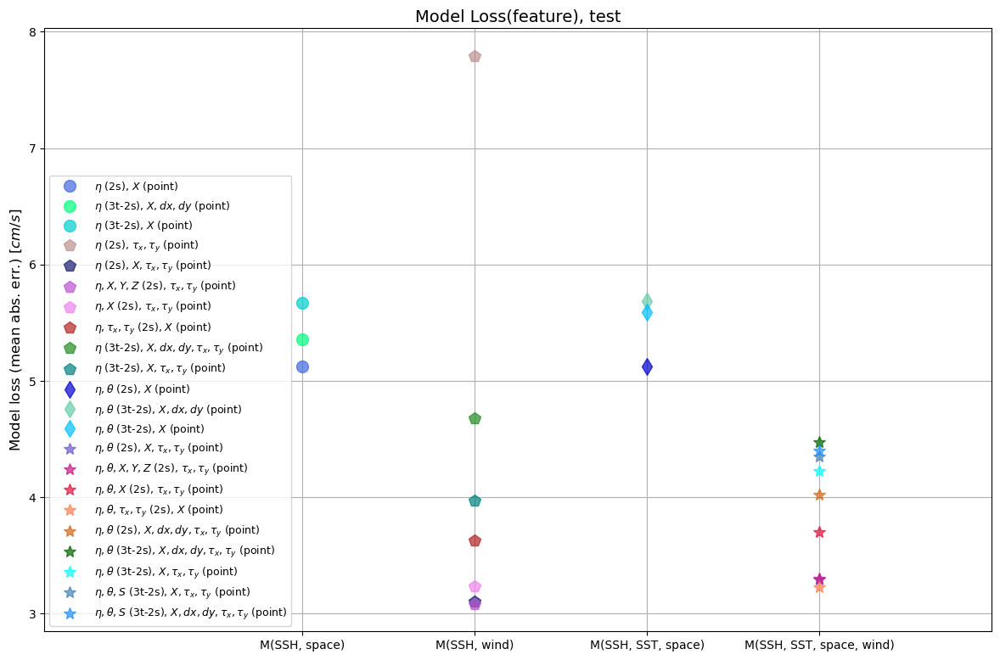

In [25]:
## Plot skill as a function of feature
plt.figure(figsize=(12,8), dpi=100, tight_layout=True)
# plt.plot(0, rmse_mean_ge_m, '^' ,color='k',  markersize=8, alpha=0.7, label = 'geostrophy')
# plt.plot(0, rmse_mean_g_m, 'v', color='gray', markersize=8, alpha=0.75, label = 'geostrophy + Ekman')

for r in ['01','004','006']:
    plt.plot(1, loss_ev[r], 'o', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['00','03','05','06','09','000','002']:
    plt.plot(2, loss_ev[r], 'p', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

    
for r in ['02','005','007']:
    plt.plot(3, loss_ev[r], 'd', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['04','07','08', '10', '11','001','003','008','009']:
    plt.plot(4, loss_ev[r], '*', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

plt.legend(fontsize=9, loc='lower left')
# plt.ylim([3,12])
plt.xlim([-0.5,5])
plt.xticks([1,2,3,4], ['M(SSH, space)', 'M(SSH, wind)', 'M(SSH, SST, space)', 'M(SSH, SST, space, wind)'])
plt.grid()
plt.title('Model Loss(feature), test')
plt.ylabel(r'Model loss (mean abs. err.) $[cm/s]$')

Text(0, 0.5, 'Mean Square Error $[cm^2/s^2]$')

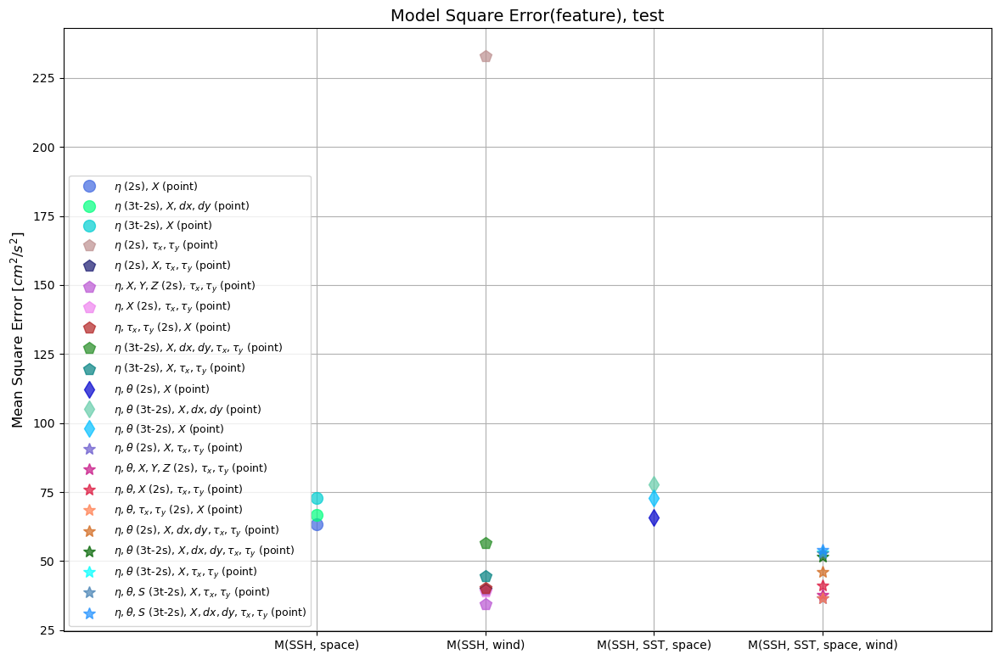

In [26]:
## Plot skill as a function of feature
plt.figure(figsize=(12,8), dpi=100, tight_layout=True)
# plt.plot(0, rmse_mean_ge_m, '^' ,color='k',  markersize=8, alpha=0.7, label = 'geostrophy')
# plt.plot(0, rmse_mean_g_m, 'v', color='gray', markersize=8, alpha=0.75, label = 'geostrophy + Ekman')

for r in ['01','004','006']:
    plt.plot(1, mse_ev[r], 'o', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['00','03','05','06','09','000','002']:
    plt.plot(2, mse_ev[r], 'p', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

    
for r in ['02','005','007']:
    plt.plot(3, mse_ev[r], 'd', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['04','07','08', '10', '11','001','003','008','009']:
    plt.plot(4, mse_ev[r], '*', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

plt.legend(fontsize=9, loc='lower left')
# plt.ylim([3,12])
plt.xlim([-0.5,5])
plt.xticks([1,2,3,4], ['M(SSH, space)', 'M(SSH, wind)', 'M(SSH, SST, space)', 'M(SSH, SST, space, wind)'])
plt.grid()

plt.title('Model Square Error(feature), test')
plt.ylabel(r'Mean Square Error $[cm^2/s^2]$')

Text(0, 0.5, 'Accuracy $[\\%]$')

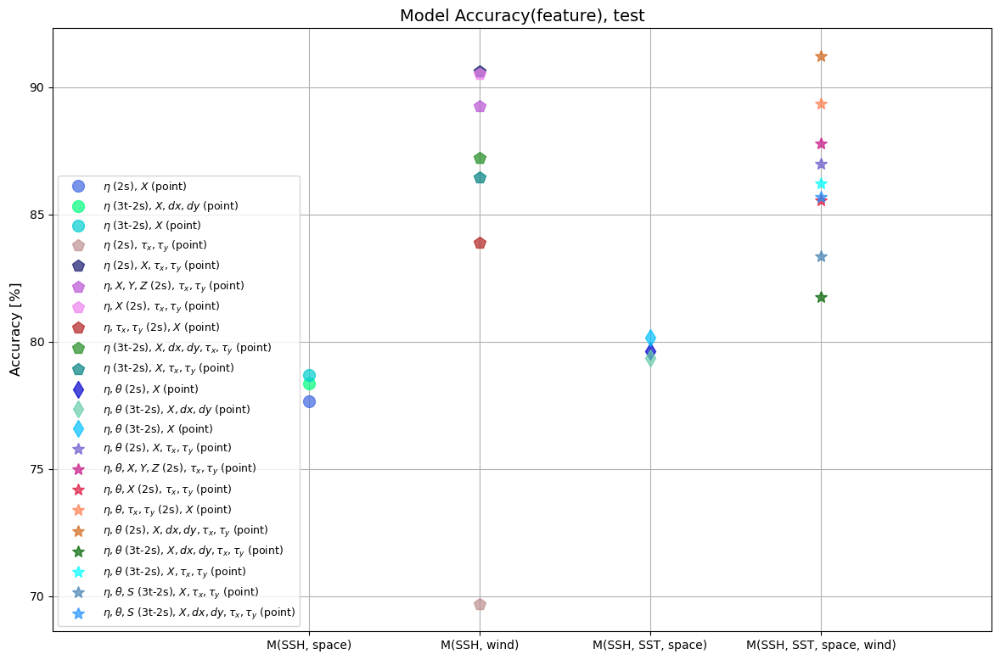

In [27]:
## Plot skill as a function of feature
plt.figure(figsize=(12,8), dpi=100, tight_layout=True)
# plt.plot(0, rmse_mean_ge_m, '^' ,color='k',  markersize=8, alpha=0.7, label = 'geostrophy')
# plt.plot(0, rmse_mean_g_m, 'v', color='gray', markersize=8, alpha=0.75, label = 'geostrophy + Ekman')

for r in ['01','004','006']:
    plt.plot(1, acc_ev[r]*100, 'o', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['00','03','05','06','09','000','002']:
    plt.plot(2, acc_ev[r]*100, 'p', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

    
for r in ['02','005','007']:
    plt.plot(3, acc_ev[r]*100, 'd', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['04','07','08', '10', '11','001','003','008','009']:
    plt.plot(4, acc_ev[r]*100, '*', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

plt.legend(fontsize=9, loc='lower left')
# plt.ylim([3,12])
plt.xlim([-0.5,5])
plt.xticks([1,2,3,4], ['M(SSH, space)', 'M(SSH, wind)', 'M(SSH, SST, space)', 'M(SSH, SST, space, wind)'])
plt.grid()

plt.title('Model Accuracy(feature), test')
plt.ylabel(r'Accuracy $[\%]$')

Text(0, 0.5, 'Accuracy $[\\%]$')

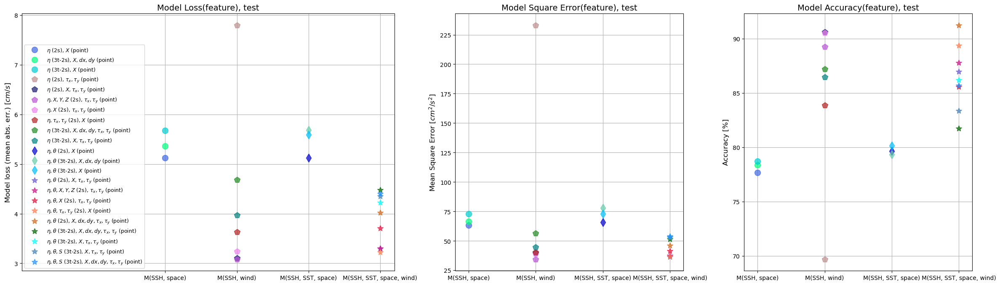

In [41]:
plt.figure(figsize=(24,7), dpi=100, tight_layout=True)
plt.subplot2grid((1, 7), (0, 0), colspan=3)
for r in ['01','004','006']:
    plt.plot(1, loss_ev[r], 'o', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['00','03','05','06','09','000','002']:
    plt.plot(2, loss_ev[r], 'p', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

    
for r in ['02','005','007']:
    plt.plot(3, loss_ev[r], 'd', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['04','07','08', '10', '11','001','003','008','009']:
    plt.plot(4, loss_ev[r], '*', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

plt.legend(fontsize=9, loc='lower left')
# plt.ylim([3,12])
plt.xlim([-1,4.2])
plt.xticks([1,2,3,4], ['M(SSH, space)', 'M(SSH, wind)', 'M(SSH, SST, space)', 'M(SSH, SST, space, wind)'])
plt.grid()
plt.title('Model Loss(feature), test')
plt.ylabel(r'Model loss (mean abs. err.) $[cm/s]$')

plt.subplot2grid((1, 7), (0, 3), colspan=2)
for r in ['01','004','006']:
    plt.plot(1, mse_ev[r], 'o', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['00','03','05','06','09','000','002']:
    plt.plot(2, mse_ev[r], 'p', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

    
for r in ['02','005','007']:
    plt.plot(3, mse_ev[r], 'd', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['04','07','08', '10', '11','001','003','008','009']:
    plt.plot(4, mse_ev[r], '*', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

# plt.legend(fontsize=9, loc='lower left')
# plt.ylim([3,12])
plt.xlim([0.8,4.2])
plt.xticks([1,2,3,4], ['M(SSH, space)', 'M(SSH, wind)', 'M(SSH, SST, space)', 'M(SSH, SST, space, wind)'])
plt.grid()

plt.title('Model Square Error(feature), test')
plt.ylabel(r'Mean Square Error $[cm^2/s^2]$')

plt.subplot2grid((1, 7), (0, 5), colspan=2)
for r in ['01','004','006']:
    plt.plot(1, acc_ev[r]*100, 'o', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['00','03','05','06','09','000','002']:
    plt.plot(2, acc_ev[r]*100, 'p', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

    
for r in ['02','005','007']:
    plt.plot(3, acc_ev[r]*100, 'd', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

for r in ['04','07','08', '10', '11','001','003','008','009']:
    plt.plot(4, acc_ev[r]*100, '*', markersize=10, alpha=0.7, color = colors[r], label=plabels[r])

# plt.legend(fontsize=9, loc='lower left')
# plt.ylim([3,12])
plt.xlim([0.8,4.2])
plt.xticks([1,2,3,4], ['M(SSH, space)', 'M(SSH, wind)', 'M(SSH, SST, space)', 'M(SSH, SST, space, wind)'])
plt.grid()

plt.title('Model Accuracy(feature), test')
plt.ylabel(r'Accuracy $[\%]$')

In [19]:
mev_dsigma = {}

for mnum in m2d_dsigma_keys:
    mev_dsigma[mnum] = model['11'].evaluate(features_test[mnum], targets_test['11'])


41967/41967 [==============================] - 54s 1ms/step - loss: 5.4227 - mean_absolute_error: 5.4227 - mean_squared_error: 68.1818 - accuracy: 0.8487


In [20]:
mev_dsigma['11'] = model['11'].evaluate(features_test['11'], targets_test['11'])

41967/41967 [==============================] - 50s 1ms/step - loss: 4.0232 - mean_absolute_error: 4.0232 - mean_squared_error: 46.0133 - accuracy: 0.9123


In [22]:
mev_ds_mae = {}
mev_ds_mse = {}
mev_ds_acc = {}
for r in mev_dsigma.keys():
    mev_ds_mae[r] = mev_dsigma[r][0]
    mev_ds_mse[r] = mev_dsigma[r][2]
    mev_ds_acc[r] = mev_dsigma[r][-1]
    

-40.34772

In [74]:
dvar = {}
dvar['11_deta1s'] = 1*np.std(features_test['11'][0][:,:,:,0])
dvar['11_deta2s'] = 2*np.std(features_test['11'][0][:,:,:,0])
dvar['11_deta05s'] = 0.5*np.std(features_test['11'][0][:,:,:,0])

dvar['11_dT1s'] = 1*np.std(features_test['11'][0][:,:,:,1])
dvar['11_dT2s'] = 2*np.std(features_test['11'][0][:,:,:,1])
dvar['11_dT05s'] = 0.5*np.std(features_test['11'][0][:,:,:,1])

dvar['11_dX1s'] = 1*np.std(features_test['11'][1][:,0])
dvar['11_dX2s'] = 2*np.std(features_test['11'][1][:,0])
dvar['11_dX05s'] = 0.5*np.std(features_test['11'][1][:,0])

dvar['11_ddx1s'] = 1*np.std(features_test['11'][1][:,1])
dvar['11_ddx2s'] = 2*np.std(features_test['11'][1][:,1])
dvar['11_ddx05s'] = 0.5*np.std(features_test['11'][1][:,1])

dvar['11_ddy1s'] = 1*np.std(features_test['11'][1][:,2])
dvar['11_ddy2s'] = 2*np.std(features_test['11'][1][:,2])
dvar['11_ddy05s'] = 0.5*np.std(features_test['11'][1][:,2])

dvar['11_dTAUX1s'] = 1*np.std(features_test['11'][1][:,3])
dvar['11_dTAUX2s'] = 2*np.std(features_test['11'][1][:,3])
dvar['11_dTAUX05s'] = 0.5*np.std(features_test['11'][1][:,3])

dvar['11_dTAUY1s'] = 1*np.std(features_test['11'][1][:,4])
dvar['11_dTAUY2s'] = 2*np.std(features_test['11'][1][:,4])
dvar['11_dTAUY05s'] = 0.5*np.std(features_test['11'][1][:,4])



In [75]:
dMdvar = {}
for r in m2d_dsigma_keys:
    dMdvar[r] = (mev_ds_mae[r] - mev_ds_mae['11'])/ dvar[r]

In [76]:
dMdvar

{'11_deta1s': 0.00951045387599076,
 '11_deta2s': 0.01692781088582324,
 '11_deta05s': 0.005650558202497384,
 '11_dT1s': 0.12167075215771467,
 '11_dT2s': 0.2580294460236272,
 '11_dT05s': 0.027889369149603695,
 '11_dX1s': 5.960398153831681,
 '11_dX2s': 8.73139583163506,
 '11_dX05s': 5.703410953267986,
 '11_ddx1s': 0.5513164880716177,
 '11_ddx2s': 0.6047000558224592,
 '11_ddx05s': 0.8808939693239474,
 '11_ddy1s': 0.42095983926768454,
 '11_ddy2s': -0.00010859426974111695,
 '11_ddy05s': 1.268018532783418,
 '11_dTAUX1s': 1.7583842981421074,
 '11_dTAUX2s': 1.9168951853887046,
 '11_dTAUX05s': 2.0289848436695403,
 '11_dTAUY1s': 1.833211786461764,
 '11_dTAUY2s': 1.717937983058276,
 '11_dTAUY05s': 2.632112006673127}

In [68]:
xlabs = [r'$\Delta \eta$', r'$\Delta \theta$', r'$\Delta X$', r'$\Delta dx$', r'$\Delta dy$', r'$\Delta \tau_x$', r'$\Delta \tau_y$' ]
ylabs = [r'$\Delta = 0.5\sigma$', r'$\Delta = 1\sigma$', r'$\Delta =2 \sigma$', ]

In [65]:
# plt.figure(figsize=(10,4), tight_layout=True, dpi = 150)

# plt.subplot(131)
# plt.plot(np.array(list(mev_ds_mae.values()))[0:-1][2::3], 'v', label= ylabs[0])
# plt.plot(np.array(list(mev_ds_mae.values()))[0:-1][::3], 'o', label= ylabs[1])
# plt.plot(np.array(list(mev_ds_mae.values()))[0:-1][1::3], '^', label= ylabs[2])
# plt.hlines(np.array(list(mev_ds_mae.values()))[-1], -0.5, 6.5, linestyle = 'dashed', color = colors['11'])
# plt.xticks([0,1,2,3,4,5,6], xlabs)
# plt.grid()
# plt.legend(fontsize=9)
# plt.title(r'Mean Absolute Error $[cm/s]$')


# plt.subplot(132)
# plt.plot(np.array(list(mev_ds_mse.values()))[0:-1][2::3], 'v', label= ylabs[0])
# plt.plot(np.array(list(mev_ds_mse.values()))[0:-1][::3], 'o', label= ylabs[1])
# plt.plot(np.array(list(mev_ds_mse.values()))[0:-1][1::3], '^', label= ylabs[2])
# plt.hlines(np.array(list(mev_ds_mse.values()))[-1], -0.5, 6.5, linestyle = 'dashed', color = colors['11'])
# plt.xticks([0,1,2,3,4,5,6] , xlabs)
# plt.grid()
# plt.legend(fontsize=9)
# plt.title(r'Mean Square Error $[cm^2/s^2]$')


# plt.subplot(133)
# plt.plot(np.array(list(mev_ds_acc.values()))[0:-1][2::3]*100, 'v', label= ylabs[0])
# plt.plot(np.array(list(mev_ds_acc.values()))[0:-1][::3]*100, 'o', label= ylabs[1])
# plt.plot(np.array(list(mev_ds_acc.values()))[0:-1][1::3]*100, '^', label= ylabs[2])
# plt.hlines(np.array(list(mev_ds_acc.values()))[-1]*100, -0.5, 6.5, linestyle = 'dashed', color = colors['11'])
# plt.xticks([0,1,2,3,4,5,6] , xlabs)
# plt.grid()
# plt.legend(fontsize=9)
# plt.title(r'Model Accuracy $[\%]$')



In [66]:
# plt.figure(figsize=(10,4), tight_layout=True, dpi = 150)

# xlabs = [r'$\Delta \eta$', r'$\Delta \theta$', r'$\Delta X$', r'$\Delta dx$', r'$\Delta dy$', r'$\Delta \tau_x$', r'$\Delta \tau_y$' ]
# ylabs = [r'$\Delta = 0.5\sigma$', r'$\Delta = 1\sigma$', r'$\Delta =2 \sigma$', ]

# plt.subplot(131)
# plt.plot(np.array(list(dMdvar.values()))[0:-1][2::3], 'v', label= ylabs[0])
# plt.plot(np.array(list(dMdvar.values()))[0:-1][::3], 'o', label= ylabs[1])
# plt.plot(np.array(list(dMdvar.values()))[0:-1][1::3], '^', label= ylabs[2])
# plt.xticks([0,1,2,3,4,5,6], xlabs)
# plt.grid()
# plt.legend(fontsize=9)
# plt.title(r'Mean Absolute Error ')
# # plt.title(r'$\frac{\Delta \mathbf{M}}{\Delta \mathbf{x_i}}$, $\mathbf{x_i} \in \{\eta,\theta,X,dx,dy,\tau_x,\tau_y\}$')


# plt.subplot(132)
# plt.plot(np.array(list(dMdvar.values()))[0:-1][2::3], 'v', label= ylabs[0])
# plt.plot(np.array(list(dMdvar.values()))[0:-1][::3], 'o', label= ylabs[1])
# plt.plot(np.array(list(dMdvar.values()))[0:-1][1::3], '^', label= ylabs[2])
# plt.xticks([0,1,2,3,4,5,6] , xlabs)
# plt.grid()
# plt.legend(fontsize=9)
# plt.title(r'Mean Square Error ')
# # plt.title(r'$\frac{\Delta \mathbf{M}}{\Delta \mathbf{x_i}}$, $\mathbf{x_i} \in {\eta,\theta,X,dx,dy,\tau_x,\tau_y}$')


# plt.subplot(133)
# plt.plot(np.array(list(dMdvar.values()))[0:-1][2::3], 'v', label= ylabs[0])
# plt.plot(np.array(list(dMdvar.values()))[0:-1][::3], 'o', label= ylabs[1])
# plt.plot(np.array(list(dMdvar.values()))[0:-1][1::3], '^', label= ylabs[2])
# plt.xticks([0,1,2,3,4,5,6] , xlabs)
# plt.grid()
# plt.legend(fontsize=9)
# plt.title(r'Model Accuracy ')
# # plt.title(r'$\frac{\Delta \mathbf{M}}{\Delta \mathbf{x_i}}$, $\mathbf{x_i} \in {\eta,\theta,X,dx,dy,\tau_x,\tau_y}$')

# plt.suptitle(r'$\frac{\Delta \mathbf{M}}{\Delta \mathbf{x_i}}$, $\mathbf{x_i} \in \{\eta,\theta,X,dx,dy,\tau_x,\tau_y\}$')
